<h1 style="color:blue; text-align:center;font-family: 'Roboto', sans-serif;">Credit Card Fraud Detection</h1><br>
The Credit Card Fraud Detection Problem includes modeling past credit card transactions with the knowledge of the ones that turned out to be fraud. This model is then used to identify whether a new transaction is fraudulent or not.
<h3 style="color:blue;font-family: 'Roboto', sans-serif;"> Business Objectives</h3>
This case study aims to identify patterns which indicate if a client has difficulty paying their installments which may be used for taking actions such as denying the loan, reducing the amount of loan, lending (to risky applicants) at a higher interest rate, etc. This will ensure that the consumers capable of repaying the loan are not rejected. Identification of such applicants using EDA is the aim of this case study.
<h3 style="color:blue;font-family: 'Roboto', sans-serif;"> About Dataset </h3>
This data set is uploaded in order to get the insights of Credit card Defaultees based on the respective attributes.Dataset contains 307510 rows and 122 columns including target columns. Here our aim is to clean the dataset and find some good insight from it.

### Importing the necessary libraries

In [1]:
# DATA ANALYSIS & WRANGLING
import pandas as pd
import numpy as np

# DATA PRE-PROCESSING
# Sckit-Learn 
from sklearn.preprocessing import LabelEncoder, OneHotEncoder
from sklearn.feature_extraction import FeatureHasher
import category_encoders as ce

# SMOTE
from imblearn.over_sampling import SMOTE

# DATA VIZ
import matplotlib.pyplot as plt
import seaborn as sns


### Load the Dataset

In [2]:
df = pd.read_csv("application_data.csv")
data = df.copy()

In [3]:
from IPython.display import display
pd.options.display.max_columns = None

In [36]:
df.head(10)

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,NAME_TYPE_SUITE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,OWN_CAR_AGE,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,ORGANIZATION_TYPE,EXT_SOURCE_1,EXT_SOURCE_2,EXT_SOURCE_3,APARTMENTS_AVG,BASEMENTAREA_AVG,YEARS_BEGINEXPLUATATION_AVG,YEARS_BUILD_AVG,COMMONAREA_AVG,ELEVATORS_AVG,ENTRANCES_AVG,FLOORSMAX_AVG,FLOORSMIN_AVG,LANDAREA_AVG,LIVINGAPARTMENTS_AVG,LIVINGAREA_AVG,NONLIVINGAPARTMENTS_AVG,NONLIVINGAREA_AVG,APARTMENTS_MODE,BASEMENTAREA_MODE,YEARS_BEGINEXPLUATATION_MODE,YEARS_BUILD_MODE,COMMONAREA_MODE,ELEVATORS_MODE,ENTRANCES_MODE,FLOORSMAX_MODE,FLOORSMIN_MODE,LANDAREA_MODE,LIVINGAPARTMENTS_MODE,LIVINGAREA_MODE,NONLIVINGAPARTMENTS_MODE,NONLIVINGAREA_MODE,APARTMENTS_MEDI,BASEMENTAREA_MEDI,YEARS_BEGINEXPLUATATION_MEDI,YEARS_BUILD_MEDI,COMMONAREA_MEDI,ELEVATORS_MEDI,ENTRANCES_MEDI,FLOORSMAX_MEDI,FLOORSMIN_MEDI,LANDAREA_MEDI,LIVINGAPARTMENTS_MEDI,LIVINGAREA_MEDI,NONLIVINGAPARTMENTS_MEDI,NONLIVINGAREA_MEDI,FONDKAPREMONT_MODE,HOUSETYPE_MODE,TOTALAREA_MODE,WALLSMATERIAL_MODE,EMERGENCYSTATE_MODE,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
0,100002,1,Cash loans,M,N,Y,0,202500.0,406597.5,24700.5,351000.0,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.018801,-9461,-637,-3648.0,-2120,NaN,1,1,0,1,1,0,Laborers,1.0,2,2,WEDNESDAY,10,0,0,0,0,0,0,Business Entity Type 3,0.083037,0.262949,0.139376,0.0247,0.0369,0.9722,0.6192,0.0143,0.00,0.0690,0.0833,0.1250,0.0369,0.0202,0.0190,0.0000,0.0000,0.0252,0.0383,0.9722,0.6341,0.0144,0.0000,0.0690,0.0833,0.1250,0.0377,0.022,0.0198,0.0,0.0,0.0250,0.0369,0.9722,0.6243,0.0144,0.00,0.0690,0.0833,0.1250,0.0375,0.0205,0.0193,0.0000,0.00,reg oper account,block of flats,0.0149,"Stone, brick",No,2.0,2.0,2.0,2.0,-1134.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,1.0
1,100003,0,Cash loans,F,N,N,0,270000.0,1293502.5,35698.5,1129500.0,Family,State servant,Higher education,Married,House / apartment,0.003541,-16765,-1188,-1186.0,-291,NaN,1,1,0,1,1,0,Core staff,2.0,1,1,MONDAY,11,0,0,0,0,0,0,School,0.311267,0.622246,NaN,0.0959,0.0529,0.9851,0.7960,0.0605,0.08,0.0345,0.2917,0.3333,0.0130,0.0773,0.0549,0.0039,0.0098,0.0924,0.0538,0.9851,0.8040,0.0497,0.0806,0.0345,0.2917,0.3333,0.0128,0.079,0.0554,0.0,0.0,0.0968,0.0529,0.9851,0.7987,0.0608,0.08,0.0345,0.2917,0.3333,0.0132,0.0787,0.0558,0.0039,0.01,reg oper account,block of flats,0.0714,Block,No,1.0,0.0,1.0,0.0,-828.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
2,100004,0,Revolving loans,M,Y,Y,0,67500.0,135000.0,6750.0,135000.0,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.010032,-19046,-225,-4260.0,-2531,26.0,1,1,1,1,1,0,Laborers,1.0,2,2,MONDAY,9,0,0,0,0,0,0,Government,NaN,0.555912,0.729567,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,

# Exploratory Data Analysis ( EDA ) & Data Pre-Processing

### General Information 

In [84]:
# Data Shape & Types 

print('DataFrame Shape : ', df.shape)
print('\t')
print('DataFrame Size : ', df.size)
print('\t')
print('DataFrame Columns Type : \n', df.dtypes)

DataFrame Shape :  (307511, 122)
	
DataFrame Size :  37516342
	
DataFrame Columns Type : 
 SK_ID_CURR                      int64
TARGET                          int64
NAME_CONTRACT_TYPE             object
CODE_GENDER                    object
FLAG_OWN_CAR                   object
                               ...   
AMT_REQ_CREDIT_BUREAU_DAY     float64
AMT_REQ_CREDIT_BUREAU_WEEK    float64
AMT_REQ_CREDIT_BUREAU_MON     float64
AMT_REQ_CREDIT_BUREAU_QRT     float64
AMT_REQ_CREDIT_BUREAU_YEAR    float64
Length: 122, dtype: object


In [85]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 307511 entries, 0 to 307510
Columns: 122 entries, SK_ID_CURR to AMT_REQ_CREDIT_BUREAU_YEAR
dtypes: float64(65), int64(41), object(16)
memory usage: 286.2+ MB


In [86]:
# Summary - Statistics
df.describe(include = 'all')

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,NAME_TYPE_SUITE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,OWN_CAR_AGE,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,ORGANIZATION_TYPE,EXT_SOURCE_1,EXT_SOURCE_2,EXT_SOURCE_3,APARTMENTS_AVG,BASEMENTAREA_AVG,YEARS_BEGINEXPLUATATION_AVG,YEARS_BUILD_AVG,COMMONAREA_AVG,ELEVATORS_AVG,ENTRANCES_AVG,FLOORSMAX_AVG,FLOORSMIN_AVG,LANDAREA_AVG,LIVINGAPARTMENTS_AVG,LIVINGAREA_AVG,NONLIVINGAPARTMENTS_AVG,NONLIVINGAREA_AVG,APARTMENTS_MODE,BASEMENTAREA_MODE,YEARS_BEGINEXPLUATATION_MODE,YEARS_BUILD_MODE,COMMONAREA_MODE,ELEVATORS_MODE,ENTRANCES_MODE,FLOORSMAX_MODE,FLOORSMIN_MODE,LANDAREA_MODE,LIVINGAPARTMENTS_MODE,LIVINGAREA_MODE,NONLIVINGAPARTMENTS_MODE,NONLIVINGAREA_MODE,APARTMENTS_MEDI,BASEMENTAREA_MEDI,YEARS_BEGINEXPLUATATION_MEDI,YEARS_BUILD_MEDI,COMMONAREA_MEDI,ELEVATORS_MEDI,ENTRANCES_MEDI,FLOORSMAX_MEDI,FLOORSMIN_MEDI,LANDAREA_MEDI,LIVINGAPARTMENTS_MEDI,LIVINGAREA_MEDI,NONLIVINGAPARTMENTS_MEDI,NONLIVINGAREA_MEDI,FONDKAPREMONT_MODE,HOUSETYPE_MODE,TOTALAREA_MODE,WALLSMATERIAL_MODE,EMERGENCYSTATE_MODE,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
count,307511.000000,307511.000000,307511,307511,307511,307511,307511.000000,3.075110e+05,3.075110e+05,307499.000000,3.072330e+05,306219,307511,307511,307511,307511,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,104582.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,211120,307509.000000,307511.000000,307511.000000,307511,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511,134133.000000,3.068510e+05,246546.000000,151450.00000,127568.000000,157504.000000,103023.000000,92646.000000,143620.000000,152683.000000,154491.000000,98869.000000,124921.000000,97312.000000,153161.000000,93997.000000,137829.000000,151450.000000,127568.000000,157504.000000,103023.000000,92646.000000,143620.000000,152683.000000,154491.000000,98869.000000,124921.000000,97312.000000,153161.000000,93997.000000,137829.000000,151450.000000,127568.000000,157504.000000,103023.000000,92646.000000,143620.000000,152683.000000,154491.000000,98869.000000,124921.000000,97312.000000,153161.000000,93997.000000,137829.000000,97216,153214,159080.000000,151170,161756,306490.000000,306490.000000,306490.000000,306490.000000,307510.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.00000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,265992.000000,265992.000000,265992.000000,265992.000000,265992.000000,265992.000000
unique,NaN,NaN,2,3,2,2,NaN,NaN,NaN,NaN,NaN,7,8,5,6,6,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,18,NaN,NaN,NaN,7,NaN,NaN,NaN,NaN,NaN,NaN,NaN,58,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Na

In [4]:
# Finding numerical data and categorical data
numerical= data.select_dtypes(include=['number']).columns
categorical = data.select_dtypes(include=['object']).columns

numerical = numerical.delete(numerical.get_loc('SK_ID_CURR'))
print(f'Numerical Columns: \n {data[numerical].columns}')
print('\n')
print(f'Categorical Columns: \n{data[categorical].columns}')

Numerical Columns: 
 Index(['TARGET', 'CNT_CHILDREN', 'AMT_INCOME_TOTAL', 'AMT_CREDIT',
       'AMT_ANNUITY', 'AMT_GOODS_PRICE', 'REGION_POPULATION_RELATIVE',
       'DAYS_BIRTH', 'DAYS_EMPLOYED', 'DAYS_REGISTRATION',
       ...
       'FLAG_DOCUMENT_18', 'FLAG_DOCUMENT_19', 'FLAG_DOCUMENT_20',
       'FLAG_DOCUMENT_21', 'AMT_REQ_CREDIT_BUREAU_HOUR',
       'AMT_REQ_CREDIT_BUREAU_DAY', 'AMT_REQ_CREDIT_BUREAU_WEEK',
       'AMT_REQ_CREDIT_BUREAU_MON', 'AMT_REQ_CREDIT_BUREAU_QRT',
       'AMT_REQ_CREDIT_BUREAU_YEAR'],
      dtype='object', length=105)


Categorical Columns: 
Index(['NAME_CONTRACT_TYPE', 'CODE_GENDER', 'FLAG_OWN_CAR', 'FLAG_OWN_REALTY',
       'NAME_TYPE_SUITE', 'NAME_INCOME_TYPE', 'NAME_EDUCATION_TYPE',
       'NAME_FAMILY_STATUS', 'NAME_HOUSING_TYPE', 'OCCUPATION_TYPE',
       'WEEKDAY_APPR_PROCESS_START', 'ORGANIZATION_TYPE', 'FONDKAPREMONT_MODE',
       'HOUSETYPE_MODE', 'WALLSMATERIAL_MODE', 'EMERGENCYSTATE_MODE'],
      dtype='object')


### Data Visualization
In the initial stages of our data analysis, we conducted data exploration to gain a better understanding of the variables in our dataset. This involved examining the different modalities within each variable and obtaining general statistics to identify any trends or patterns. By performing these exploratory tasks, we aimed to uncover any useful insights or potential issues in the data that may impact our subsequent data processing and modeling steps.

Text(0.5, 1.0, 'Distribution of Target by Gender')

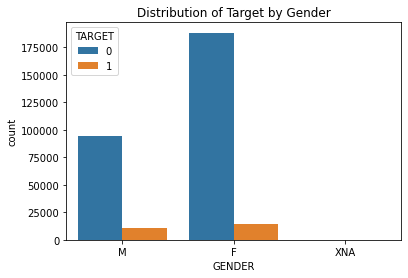

In [88]:
# Gender Distribution
sns.countplot(x="CODE_GENDER", data=data, hue='TARGET')
plt.xlabel("GENDER")
plt.title("Distribution of Target by Gender")


- We observe that the number of **Females** taking loans is much higher than the number of **Males** for both Target = 0 and Target = 1

Text(0.5, 1.0, 'Distribution of Target by Contract Type')

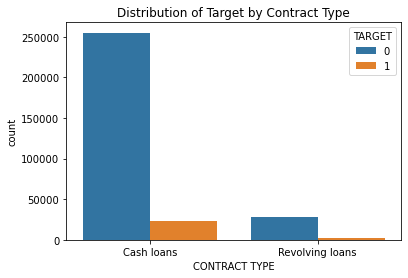

In [89]:
# Distribution of Contract Type
sns.countplot(x="NAME_CONTRACT_TYPE", data=data, hue="TARGET")
plt.xlabel("CONTRACT TYPE")
plt.title("Distribution of Target by Contract Type")


- We observe that the number of **Cash loans** is much higher than the number of **Revolving loans** for both Target = 0 and Target = 1

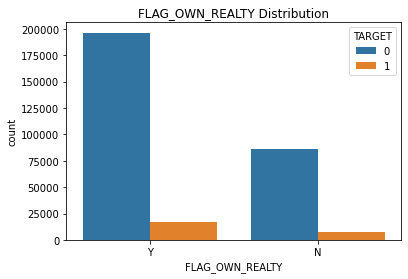

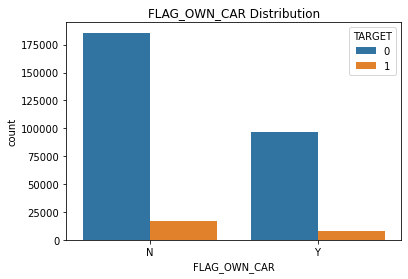

In [90]:
# The Distribution of : if client owns a house OR owns a car
sns.countplot(x="FLAG_OWN_REALTY", data=data, hue="TARGET")
plt.title("FLAG_OWN_REALTY Distribution")
plt.show()

sns.countplot(x="FLAG_OWN_CAR", data=data, hue="TARGET")
plt.title("FLAG_OWN_CAR Distribution")
plt.show()


- We observe that the number of most people applying for loan **do not own a car.** <br>
- We also observe that the **ratio of people who own a car is higher for non-defaulters (TARGET = 0)**

In [91]:
# Split the DataFrame into two DataFrames one for Defaulters(TARGET=1) and the other one for No-Defaulter(TARGET=0)
defaulters = data[data.TARGET==1]
No_defaulters = data[data.TARGET==0]

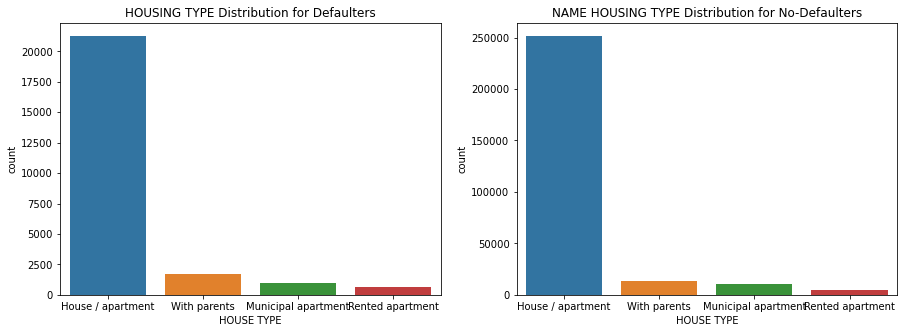

In [92]:
fig, (ax1, ax2) = plt.subplots(ncols=2, figsize=(15,5))

sns.countplot(ax=ax1, x="NAME_HOUSING_TYPE", data=defaulters, order=data["NAME_HOUSING_TYPE"].value_counts().head(4).index)
ax1.set_xlabel("HOUSE TYPE")
ax1.set_title("HOUSING TYPE Distribution for Defaulters")

sns.countplot(ax=ax2, x="NAME_HOUSING_TYPE", data=No_defaulters, order=data["NAME_HOUSING_TYPE"].value_counts().head(4).index)
ax2.set_xlabel("HOUSE TYPE")
ax2.set_title("NAME HOUSING TYPE Distribution for No-Defaulters")
plt.show()


- Most people live in a House and Apartment
- Ratio of People who live **With Parents** is more for defaulter than non-defaulters. It tells us that applicant who live with parents have a higher chance of having payment difficulties.

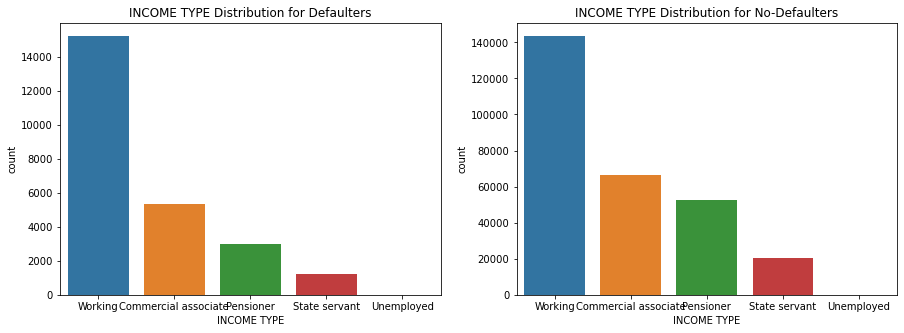

In [93]:
#Income Type Distribution 
fig, (ax1, ax2) = plt.subplots(ncols=2, figsize=(15,5))
sns.countplot(ax=ax1, x="NAME_INCOME_TYPE", data=defaulters, order=data["NAME_INCOME_TYPE"].value_counts().head(5).index)
ax1.set_xlabel("INCOME TYPE")
ax1.set_title("INCOME TYPE Distribution for Defaulters")

sns.countplot(ax=ax2, x="NAME_INCOME_TYPE", data=No_defaulters, order=data["NAME_INCOME_TYPE"].value_counts().head(5).index)
ax2.set_xlabel("INCOME TYPE")
ax2.set_title("INCOME TYPE Distribution for No-Defaulters")
plt.show()


- Top 3 categories of peple who applied for loans were getting income by working, Commercial associates or were pensioners, highest being the Working class category.
- Commercial associates, Pensioner, State Servants have a higher ratio to total in non-defaulters.

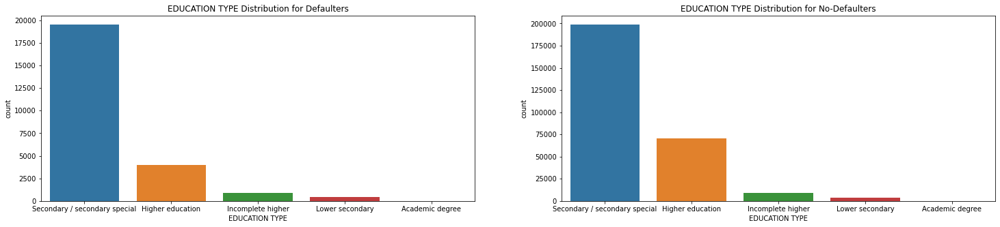

In [94]:
# Education Type Distribution 
fig, (ax1, ax2) = plt.subplots(ncols=2, figsize=(25,5))
sns.countplot(ax=ax1, x="NAME_EDUCATION_TYPE", data=defaulters, order=data["NAME_EDUCATION_TYPE"].value_counts().head(5).index)
ax1.set_xlabel("EDUCATION TYPE")
ax1.set_title("EDUCATION TYPE Distribution for Defaulters")

sns.countplot(ax=ax2, x="NAME_EDUCATION_TYPE", data=No_defaulters, order=data["NAME_EDUCATION_TYPE"].value_counts().head(5).index)
ax2.set_xlabel("EDUCATION TYPE")
ax2.set_title("EDUCATION TYPE Distribution for No-Defaulters")
plt.show()


- This chart tells us that people with Academic Degree rarely take loans and are rarely defaulters. So they are potentially good customers.
- People with higher education are less likely to have payment difficulties. The Ratio is higher for non-defaulters than defaulters.
- People with Secondary or secondary special education applied the highest number of loans followed by Higher educated people.

Text(0.5, 1.0, 'Family Status Distribution for No-Defaulters')

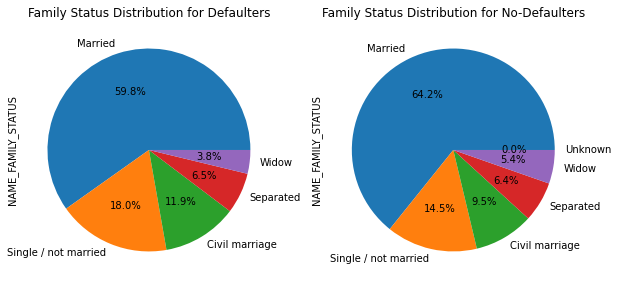

In [95]:
# Family Status Distribution 
fig, (ax1, ax2) = plt.subplots(ncols=2, figsize=(25,5))

defaulters['NAME_FAMILY_STATUS'].value_counts().plot(kind='pie',autopct='%1.1f%%', figsize=(10, 5), ax=ax1)
ax1.set_title('Family Status Distribution for Defaulters')

No_defaulters['NAME_FAMILY_STATUS'].value_counts().plot(kind='pie',autopct='%1.1f%%', figsize=(10, 5), ax=ax2)
ax2.set_title('Family Status Distribution for No-Defaulters')

- Mostly married people applied for loans followed by Single people with a huge difference

In [96]:
# Distribution of Occupation Type
labels = data['OCCUPATION_TYPE'].unique()
print('All the type of occupation:\n', labels)

All the type of occupation:
 ['Laborers' 'Core staff' 'Accountants' 'Managers' nan 'Drivers'
 'Sales staff' 'Cleaning staff' 'Cooking staff' 'Private service staff'
 'Medicine staff' 'Security staff' 'High skill tech staff'
 'Waiters/barmen staff' 'Low-skill Laborers' 'Realty agents' 'Secretaries'
 'IT staff' 'HR staff']


Text(0.5, 1.0, 'OCCUPATION TYPE Distribution')

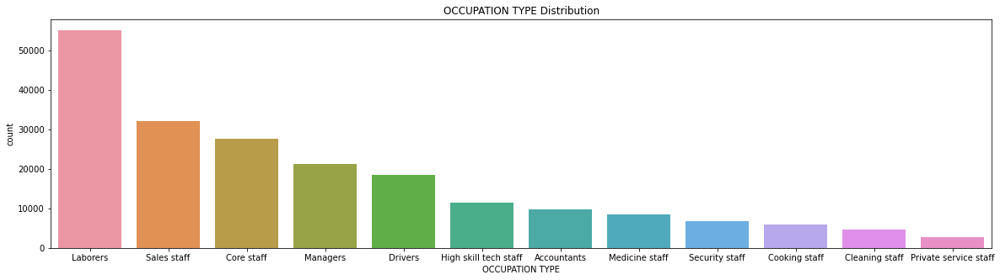

In [97]:
# Distribution of Occupation Type
fig, ax1 = plt.subplots(ncols=1, figsize=(20,5))
sns.countplot(ax=ax1, x="OCCUPATION_TYPE", data=data, order=data["OCCUPATION_TYPE"].value_counts().head(12).index)
ax1.set_xlabel("OCCUPATION TYPE")
ax1.set_title("OCCUPATION TYPE Distribution")

In [98]:
# Distribution of organization type
labels = data['ORGANIZATION_TYPE'].unique()
print('All the type of occupation:\n', labels)

All the type of occupation:
 ['Business Entity Type 3' 'School' 'Government' 'Religion' 'Other' 'XNA'
 'Electricity' 'Medicine' 'Business Entity Type 2' 'Self-employed'
 'Transport: type 2' 'Construction' 'Housing' 'Kindergarten'
 'Trade: type 7' 'Industry: type 11' 'Military' 'Services'
 'Security Ministries' 'Transport: type 4' 'Industry: type 1' 'Emergency'
 'Security' 'Trade: type 2' 'University' 'Transport: type 3' 'Police'
 'Business Entity Type 1' 'Postal' 'Industry: type 4' 'Agriculture'
 'Restaurant' 'Culture' 'Hotel' 'Industry: type 7' 'Trade: type 3'
 'Industry: type 3' 'Bank' 'Industry: type 9' 'Insurance' 'Trade: type 6'
 'Industry: type 2' 'Transport: type 1' 'Industry: type 12' 'Mobile'
 'Trade: type 1' 'Industry: type 5' 'Industry: type 10' 'Legal Services'
 'Advertising' 'Trade: type 5' 'Cleaning' 'Industry: type 13'
 'Trade: type 4' 'Telecom' 'Industry: type 8' 'Realtor' 'Industry: type 6']


Text(0.5, 1.0, 'ORGANIZATION TYPE Distribution')

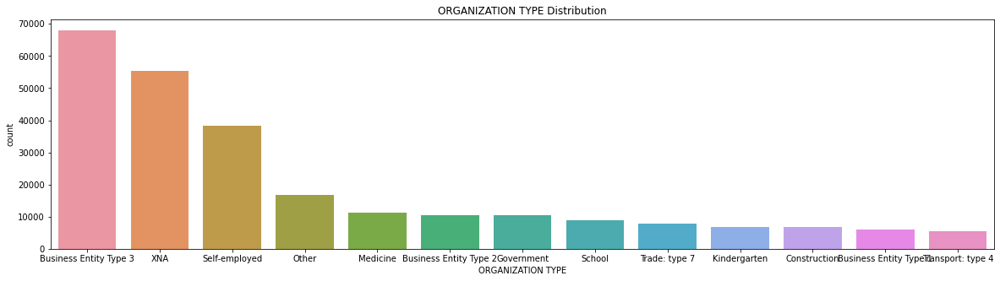

In [99]:
# Distribution of organization type
fig, ax1 = plt.subplots(ncols=1, figsize=(20,5))
sns.countplot(ax=ax1,x="ORGANIZATION_TYPE", data=data, order=data["ORGANIZATION_TYPE"].value_counts().head(13).index) 
ax1.set_xlabel("ORGANIZATION TYPE")
ax1.set_title("ORGANIZATION TYPE Distribution")

- Most of the people who applied for loans either work in Business Entity type 3 kind of organizations and the other top 2 are unknown types and Self-employed respectively.

#### Numeric Data

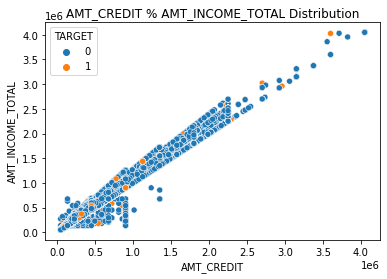

In [100]:
sns.scatterplot(data=data,x='AMT_GOODS_PRICE',y='AMT_CREDIT',hue='TARGET')
plt.title("AMT_CREDIT % AMT_INCOME_TOTAL Distribution")
plt.xlabel("AMT_CREDIT")
plt.ylabel("AMT_INCOME_TOTAL")
plt.show()

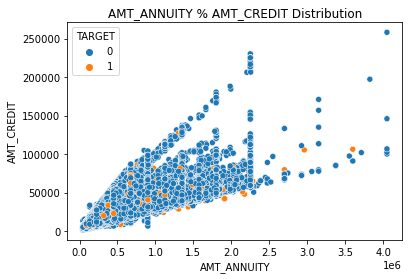

In [101]:
sns.scatterplot(data=data,x='AMT_GOODS_PRICE',y='AMT_ANNUITY',hue='TARGET')
plt.title("AMT_ANNUITY % AMT_CREDIT Distribution")
plt.xlabel("AMT_ANNUITY")
plt.ylabel("AMT_CREDIT")
plt.show()

Text(0, 0.5, 'AMT_INCOME_TOTAL')

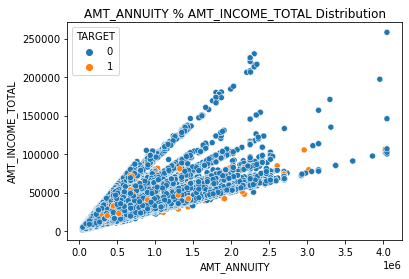

In [102]:
sns.scatterplot(data=data,x='AMT_CREDIT',y='AMT_ANNUITY',hue='TARGET')
plt.title("AMT_ANNUITY % AMT_INCOME_TOTAL Distribution")
plt.xlabel("AMT_ANNUITY")
plt.ylabel("AMT_INCOME_TOTAL")

- An increasing relationship is established between AMT_GOODS_PRICE and AMT_CREDIT.
- AMT_CREDIT and AMT_ANNUITY' , 'AMT_CREDIT and AMT_Goods_price' , 'AMT_ANNUITY AND AMT_GOODS_PRICE' have a rising relation if not completely linear relation with few exceptions.
- It becomes difficult for applicant to pay if the 'AMT_CREDIT and AMT_ANNUITY' , 'AMT_CREDIT and AMT_Goods_price' , 'AMT_ANNUITY AND AMT_GOODS_PRICE' rises together.

C:\Users\MSI\anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
C:\Users\MSI\anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


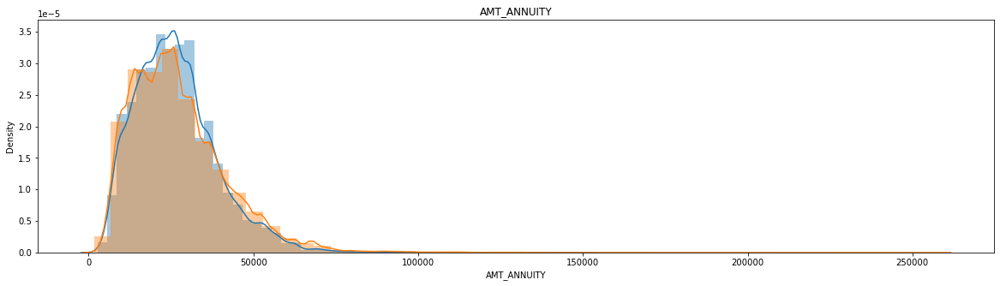

In [103]:
plt.figure(figsize=(20,5))
sns.distplot(defaulters['AMT_ANNUITY'], kde=True)
sns.distplot(No_defaulters['AMT_ANNUITY'], kde=True)
plt.title('AMT_ANNUITY')
plt.show()

### Handling With Outliers
#### Checking & Removing Outliers

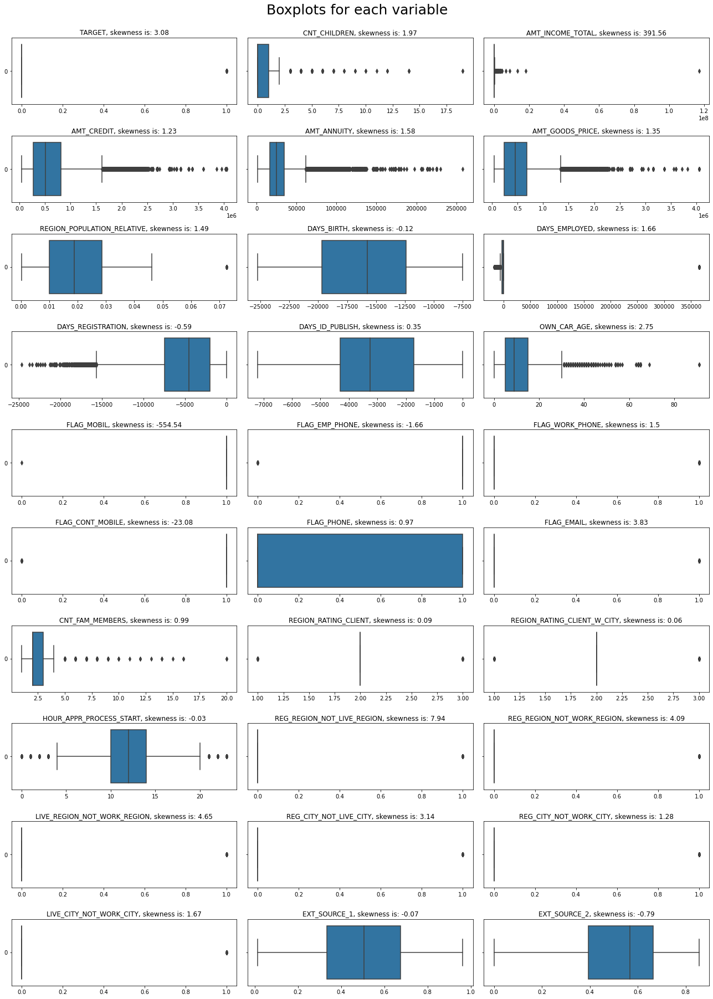

In [104]:
# checking boxplots
def boxplots_custom(dataset, columns_list, rows, cols, suptitle):
    fig, axs = plt.subplots(rows, cols, sharey=True, figsize=(18,25))
    fig.suptitle(suptitle,y=1, size=25)
    axs = axs.flatten()
    for i, data in enumerate(columns_list[:rows*cols]):
        sns.boxplot(data=dataset[data], orient='h', ax=axs[i])
        axs[i].set_title(data + ', skewness is: '+str(round(dataset[data].skew(axis = 0, skipna = True),2)))
        
boxplots_custom(dataset=data, columns_list=numerical, rows=10, cols=3, suptitle='Boxplots for each variable')
plt.tight_layout()

- The first quartile almost missing for **CNT_CHILDREN** that means most of the data are present in the first quartile.

- There is single high value data point as outlier present in **AMT_INCOME_TOTAL** and Removal this point will dtrasticaly impact the box plot for further analysis.

- The first quartiles is slim compare to third quartile for **AMT_CREDIT,AMT_ANNUITY**, **DAYS_EMPLOYED**, **DAYS_REGISTRATION.** This mean data are skewed towards first quartile.
- For **'AMT_GOODS_PRICE'** there is significant number of outlier present in the data. SO data should be imputed with median value: 450000
- For **'EXT_SOURCE_1'**,**'EXT_SOURCE_2'**,**'EXT_SOURCE_3'** there is no outliers present. And there is no significant diffence observed between mean and median. However data look to be right skewed. So missing values can be imputed with median value: 0.565 for **'EXT_SOURCE_2'** and with Mean for **'EXT_SOURCE_1'**,**'EXT_SOURCE_3'**

In [105]:
## FUNCTION FOR PLOTTING BOX PLOT AND HISTOGRAM FOR DEFAULTERS
def plot_boxhist(var):
    plt.figure(figsize=(15,5))
    plt.subplot(1, 2, 1)
    s=sns.boxplot(y=defaulters[var]);
    plt.title('Box Plot of '+ '%s' %var +' for Defaulters', fontsize=10)
    plt.xlabel('%s' %var)
    plt.ylabel("Count of Loans")
    plt.subplot(1, 2, 2)
    s=plt.hist(x=defaulters[var]);
    plt.xlabel('%s' %var)
    plt.ylabel("Count of Loans")
    plt.title('Histogram of '+ '%s' %var +' for Defaulters', fontsize=10)
plt.show()

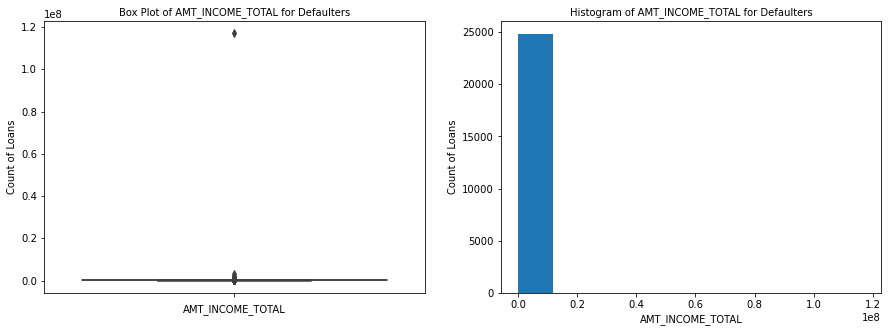

In [106]:
plot_boxhist('AMT_INCOME_TOTAL')

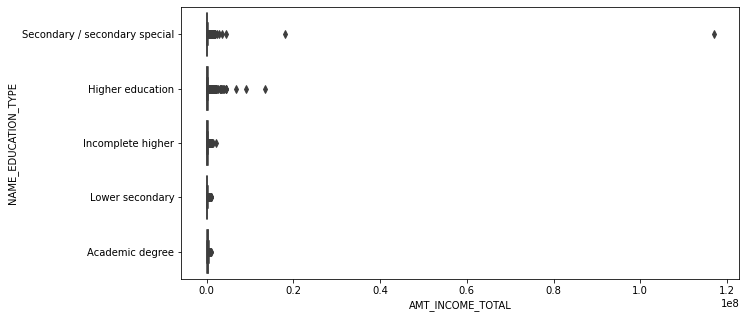

In [107]:
plt.figure(figsize=(10,5))
sns.boxplot(data=data, x="AMT_INCOME_TOTAL", y="NAME_EDUCATION_TYPE") 
plt.show()

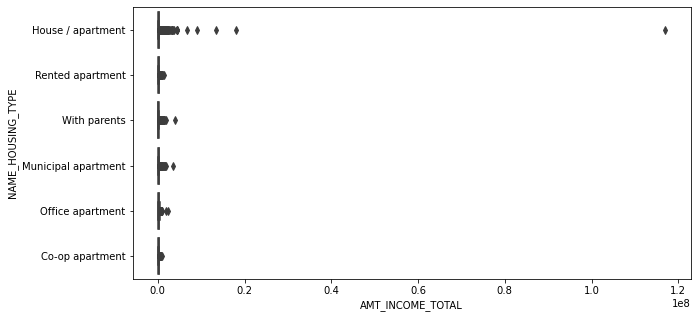

In [108]:
plt.figure(figsize=(10,5))
sns.boxplot(data=data, x="AMT_INCOME_TOTAL", y="NAME_HOUSING_TYPE") 
plt.show()

In [109]:
data[data['AMT_INCOME_TOTAL']>1.0*1e8]

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,NAME_TYPE_SUITE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,OWN_CAR_AGE,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,ORGANIZATION_TYPE,EXT_SOURCE_1,EXT_SOURCE_2,EXT_SOURCE_3,APARTMENTS_AVG,BASEMENTAREA_AVG,YEARS_BEGINEXPLUATATION_AVG,YEARS_BUILD_AVG,COMMONAREA_AVG,ELEVATORS_AVG,ENTRANCES_AVG,FLOORSMAX_AVG,FLOORSMIN_AVG,LANDAREA_AVG,LIVINGAPARTMENTS_AVG,LIVINGAREA_AVG,NONLIVINGAPARTMENTS_AVG,NONLIVINGAREA_AVG,APARTMENTS_MODE,BASEMENTAREA_MODE,YEARS_BEGINEXPLUATATION_MODE,YEARS_BUILD_MODE,COMMONAREA_MODE,ELEVATORS_MODE,ENTRANCES_MODE,FLOORSMAX_MODE,FLOORSMIN_MODE,LANDAREA_MODE,LIVINGAPARTMENTS_MODE,LIVINGAREA_MODE,NONLIVINGAPARTMENTS_MODE,NONLIVINGAREA_MODE,APARTMENTS_MEDI,BASEMENTAREA_MEDI,YEARS_BEGINEXPLUATATION_MEDI,YEARS_BUILD_MEDI,COMMONAREA_MEDI,ELEVATORS_MEDI,ENTRANCES_MEDI,FLOORSMAX_MEDI,FLOORSMIN_MEDI,LANDAREA_MEDI,LIVINGAPARTMENTS_MEDI,LIVINGAREA_MEDI,NONLIVINGAPARTMENTS_MEDI,NONLIVINGAREA_MEDI,FONDKAPREMONT_MODE,HOUSETYPE_MODE,TOTALAREA_MODE,WALLSMATERIAL_MODE,EMERGENCYSTATE_MODE,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
12840,114967,1,Cash loans,F,N,Y,1,117000000.0,562491.0,26194.5,454500.0,Unaccompanied,Working,Secondary / secondary special,Married,House / apartment,0.010643,-12615,-922,-6762.0,-3643,NaN,1,1,0,1,0,0,Laborers,3.0,2,2,TUESDAY,14,0,0,0,0,0,0,Business Entity Type 3,0.460809,0.113161,0.145543,0.1031,0.0947,0.9791,NaN,NaN,0.0,0.2069,0.1667,NaN,0.0688,NaN,0.0615,NaN,NaN,0.105,0.0983,0.9791,NaN,NaN,0.0,0.2069,0.1667,NaN,0.0704,NaN,0.0641,NaN,NaN,0.1041,0.0947,0.9791,NaN,NaN,0.0,0.2069,0.1667,NaN,0.07,NaN,0.0626,NaN,NaN,NaN,block of flats,0.0715,"Stone, brick",No,0.0,0.0,0.0,0.0,0.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,1.0


- We found an outlier in the AMT_INCOME_TOTAL variable, but it turns out to be relevant to our analysis since it corresponds to fraud cases (TARGET=1). Therefore, we decided to keep this data point in our analysis as it can provide useful information on fraudulent transactions.

### Relation Between Variables: 
**Correlation BEFORE converting categorical data to numerical data and handling missing values**<br>
When analyzing numerical variables, we often use correlation analysis to determine whether there is a strong correlation between two variables. If the absolute value of the correlation coefficient is greater than 0.8, it indicates a strong linear relationship between the variables. In order to reduce the number of columns and avoid multicollinearity, we may choose to drop one of the variables in cases where such a strong correlation exists. This approach is commonly used in data analysis to improve model performance and reduce complexity.

In [110]:
data.corr().style.background_gradient(cmap='YlGnBu', axis=None)

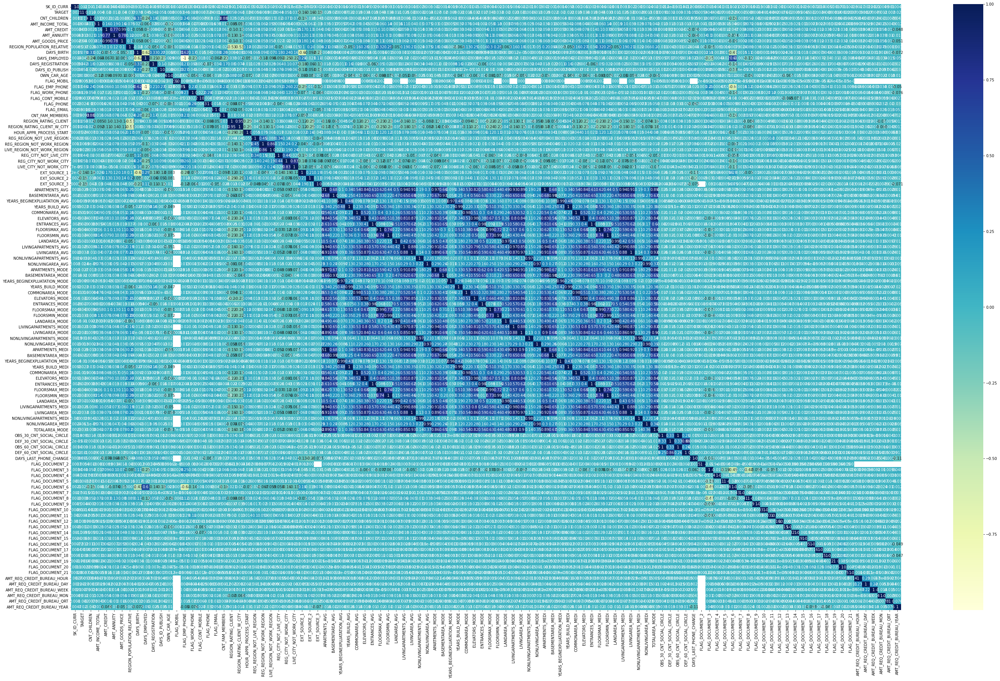

In [111]:
plt.figure(figsize=(50,30))
sns.heatmap(data.corr(), cmap="YlGnBu", annot=True)
plt.show()

In [114]:
list(data.columns.values)

['SK_ID_CURR',
 'TARGET',
 'NAME_CONTRACT_TYPE',
 'CODE_GENDER',
 'FLAG_OWN_CAR',
 'FLAG_OWN_REALTY',
 'CNT_CHILDREN',
 'AMT_INCOME_TOTAL',
 'AMT_CREDIT',
 'AMT_ANNUITY',
 'AMT_GOODS_PRICE',
 'NAME_TYPE_SUITE',
 'NAME_INCOME_TYPE',
 'NAME_EDUCATION_TYPE',
 'NAME_FAMILY_STATUS',
 'NAME_HOUSING_TYPE',
 'REGION_POPULATION_RELATIVE',
 'DAYS_BIRTH',
 'DAYS_EMPLOYED',
 'DAYS_REGISTRATION',
 'DAYS_ID_PUBLISH',
 'OWN_CAR_AGE',
 'FLAG_MOBIL',
 'FLAG_EMP_PHONE',
 'FLAG_WORK_PHONE',
 'FLAG_CONT_MOBILE',
 'FLAG_PHONE',
 'FLAG_EMAIL',
 'OCCUPATION_TYPE',
 'CNT_FAM_MEMBERS',
 'REGION_RATING_CLIENT',
 'REGION_RATING_CLIENT_W_CITY',
 'WEEKDAY_APPR_PROCESS_START',
 'HOUR_APPR_PROCESS_START',
 'REG_REGION_NOT_LIVE_REGION',
 'REG_REGION_NOT_WORK_REGION',
 'LIVE_REGION_NOT_WORK_REGION',
 'REG_CITY_NOT_LIVE_CITY',
 'REG_CITY_NOT_WORK_CITY',
 'LIVE_CITY_NOT_WORK_CITY',
 'ORGANIZATION_TYPE',
 'EXT_SOURCE_1',
 'EXT_SOURCE_2',
 'EXT_SOURCE_3',
 'APARTMENTS_AVG',
 'BASEMENTAREA_AVG',
 'YEARS_BEGINEXPLUATATION_A

In [3]:
data.drop(['CNT_CHILDREN','FLAG_EMP_PHONE','REG_REGION_NOT_LIVE_REGION','REG_CITY_NOT_WORK_CITY','BASEMENTAREA_MODE','APARTMENTS_MODE','YEARS_BEGINEXPLUATATION_MODE','YEARS_BUILD_MODE',
          'COMMONAREA_MODE','ELEVATORS_MODE','ENTRANCES_MODE','FLOORSMAX_MODE','FLOORSMIN_MODE','LANDAREA_MODE','LIVINGAPARTMENTS_MODE',
          'LIVINGAREA_MODE','NONLIVINGAPARTMENTS_MODE','NONLIVINGAREA_MODE','BASEMENTAREA_MEDI','APARTMENTS_MEDI','YEARS_BEGINEXPLUATATION_MEDI','YEARS_BUILD_MEDI',
          'COMMONAREA_MEDI','ELEVATORS_MEDI','ENTRANCES_MEDI','FLOORSMAX_MEDI','FLOORSMIN_MEDI','LANDAREA_MEDI','LIVINGAPARTMENTS_MEDI',
          'LIVINGAREA_MEDI','NONLIVINGAPARTMENTS_MEDI','NONLIVINGAREA_MEDI','OBS_30_CNT_SOCIAL_CIRCLE','DEF_30_CNT_SOCIAL_CIRCLE','AMT_GOODS_PRICE','REGION_RATING_CLIENT_W_CITY'], axis=1, inplace=True)

In [4]:
data.drop(['LIVINGAPARTMENTS_AVG','LIVINGAREA_AVG','TOTALAREA_MODE','ELEVATORS_AVG','REG_REGION_NOT_WORK_REGION','FLOORSMIN_AVG'],axis=1, inplace=True)

In [5]:
data.shape

(307511, 80)

In [6]:
# Finding numerical data and categorical data
numerical= data.select_dtypes(include=['number']).columns
categorical = data.select_dtypes(include=['object']).columns

numerical = numerical.delete(numerical.get_loc('SK_ID_CURR'))
print(f'Numerical Columns: \n {data[numerical].columns}')
print('\n')
print(f'Categorical Columns: \n{data[categorical].columns}')

Numerical Columns: 
 Index(['TARGET', 'AMT_INCOME_TOTAL', 'AMT_CREDIT', 'AMT_ANNUITY',
       'REGION_POPULATION_RELATIVE', 'DAYS_BIRTH', 'DAYS_EMPLOYED',
       'DAYS_REGISTRATION', 'DAYS_ID_PUBLISH', 'OWN_CAR_AGE', 'FLAG_MOBIL',
       'FLAG_WORK_PHONE', 'FLAG_CONT_MOBILE', 'FLAG_PHONE', 'FLAG_EMAIL',
       'CNT_FAM_MEMBERS', 'REGION_RATING_CLIENT', 'HOUR_APPR_PROCESS_START',
       'LIVE_REGION_NOT_WORK_REGION', 'REG_CITY_NOT_LIVE_CITY',
       'LIVE_CITY_NOT_WORK_CITY', 'EXT_SOURCE_1', 'EXT_SOURCE_2',
       'EXT_SOURCE_3', 'APARTMENTS_AVG', 'BASEMENTAREA_AVG',
       'YEARS_BEGINEXPLUATATION_AVG', 'YEARS_BUILD_AVG', 'COMMONAREA_AVG',
       'ENTRANCES_AVG', 'FLOORSMAX_AVG', 'LANDAREA_AVG',
       'NONLIVINGAPARTMENTS_AVG', 'NONLIVINGAREA_AVG',
       'OBS_60_CNT_SOCIAL_CIRCLE', 'DEF_60_CNT_SOCIAL_CIRCLE',
       'DAYS_LAST_PHONE_CHANGE', 'FLAG_DOCUMENT_2', 'FLAG_DOCUMENT_3',
       'FLAG_DOCUMENT_4', 'FLAG_DOCUMENT_5', 'FLAG_DOCUMENT_6',
       'FLAG_DOCUMENT_7', 'FLAG_DOCUMENT_8

### Missing Values
**Handling Missing Values**

In [47]:
# Percentage of Missing Values in each column
missing_percentages = data.isnull().mean(axis=0) * 100

print("Missing value percentages:")
for col_name, percent in missing_percentages.iteritems():
    print(f"{col_name}: {percent:.2f}%")

Missing value percentages:
SK_ID_CURR: 0.00%
TARGET: 0.00%
NAME_CONTRACT_TYPE: 0.00%
CODE_GENDER: 0.00%
FLAG_OWN_CAR: 0.00%
FLAG_OWN_REALTY: 0.00%
AMT_INCOME_TOTAL: 0.00%
AMT_CREDIT: 0.00%
AMT_ANNUITY: 0.00%
NAME_TYPE_SUITE: 0.42%
NAME_INCOME_TYPE: 0.00%
NAME_EDUCATION_TYPE: 0.00%
NAME_FAMILY_STATUS: 0.00%
NAME_HOUSING_TYPE: 0.00%
REGION_POPULATION_RELATIVE: 0.00%
DAYS_BIRTH: 0.00%
DAYS_EMPLOYED: 0.00%
DAYS_REGISTRATION: 0.00%
DAYS_ID_PUBLISH: 0.00%
OWN_CAR_AGE: 65.99%
FLAG_MOBIL: 0.00%
FLAG_WORK_PHONE: 0.00%
FLAG_CONT_MOBILE: 0.00%
FLAG_PHONE: 0.00%
FLAG_EMAIL: 0.00%
OCCUPATION_TYPE: 31.35%
CNT_FAM_MEMBERS: 0.00%
REGION_RATING_CLIENT: 0.00%
WEEKDAY_APPR_PROCESS_START: 0.00%
HOUR_APPR_PROCESS_START: 0.00%
LIVE_REGION_NOT_WORK_REGION: 0.00%
REG_CITY_NOT_LIVE_CITY: 0.00%
LIVE_CITY_NOT_WORK_CITY: 0.00%
ORGANIZATION_TYPE: 0.00%
EXT_SOURCE_1: 56.38%
EXT_SOURCE_2: 0.21%
EXT_SOURCE_3: 19.83%
APARTMENTS_AVG: 50.75%
BASEMENTAREA_AVG: 58.52%
YEARS_BEGINEXPLUATATION_AVG: 48.78%
YEARS_BUILD_AVG: 6

In [120]:
# calculate the percentage of missing values in each column
missing_percentages = data.isnull().mean(axis=0) * 100

# create a function to apply the color to the percentages
def color_percentages(val):
    if val > 60:
        color = 'red'
    elif val > 50:
        color = 'orange'
    else:
        color = 'green'
    return f'background-color: {color}'

sorted_percentages = missing_percentages.sort_values(ascending=False)
colored_percentages = sorted_percentages.to_frame().style.applymap(color_percentages) 

# "styles.applymap" a pandas Styler object that contains 
#the missing value percentages DataFrame with background colors applied to each cell based on the value

# display the results
display(colored_percentages)

,0
COMMONAREA_AVG,69.872297
NONLIVINGAPARTMENTS_AVG,69.432963
FONDKAPREMONT_MODE,68.386172
YEARS_BUILD_AVG,66.497784
OWN_CAR_AGE,65.990810
LANDAREA_AVG,59.376738
BASEMENTAREA_AVG,58.515956
EXT_SOURCE_1,56.381073
NONLIVINGAREA_AVG,55.179164
WALLSMATERIAL_MODE,50.840783


### Missing Value Imputation

**Interpolation** is a technique in Python with which you can estimate unknown data points between two known data points. It is commonly used to fill missing values in a table or a dataset using the already known values.<br>

In [7]:
# Imputation of missing values
for i in data.columns:
    if data[i].dtypes == 'object':
        data[i].fillna(data[i].mode()[0], inplace=True)
    else:
        if i not in ['EXT_SOURCE_1', 'EXT_SOURCE_2', 'EXT_SOURCE_3']:
            data[i].fillna(data[i].interpolate(), inplace=True)

In [8]:
data['EXT_SOURCE_1'].fillna(data['EXT_SOURCE_1'].mean(), inplace=True)
data['EXT_SOURCE_2'].fillna(data['EXT_SOURCE_2'].median(), inplace=True)
data['EXT_SOURCE_3'].fillna(data['EXT_SOURCE_3'].mean(), inplace=True)
data['OWN_CAR_AGE'].fillna(data['OWN_CAR_AGE'].mean(), inplace=True)

In [123]:
data.head(10)

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,NAME_TYPE_SUITE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,OWN_CAR_AGE,FLAG_MOBIL,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,LIVE_CITY_NOT_WORK_CITY,ORGANIZATION_TYPE,EXT_SOURCE_1,EXT_SOURCE_2,EXT_SOURCE_3,APARTMENTS_AVG,BASEMENTAREA_AVG,YEARS_BEGINEXPLUATATION_AVG,YEARS_BUILD_AVG,COMMONAREA_AVG,ENTRANCES_AVG,FLOORSMAX_AVG,LANDAREA_AVG,NONLIVINGAPARTMENTS_AVG,NONLIVINGAREA_AVG,FONDKAPREMONT_MODE,HOUSETYPE_MODE,WALLSMATERIAL_MODE,EMERGENCYSTATE_MODE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
0,100002,1,Cash loans,M,N,Y,202500.0,406597.5,24700.5,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.018801,-9461,-637,-3648.0,-2120,12.042651,1,0,1,1,0,Laborers,1.0,2,WEDNESDAY,10,0,0,0,Business Entity Type 3,0.083037,0.262949,0.139376,0.024700,0.0369,0.972200,0.6192,0.014300,0.069000,0.083300,0.036900,0.000000,0.000000,reg oper account,block of flats,"Stone, brick",No,2.0,2.0,-1134.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,1.0
1,100003,0,Cash loans,F,N,N,270000.0,1293502.5,35698.5,Family,State servant,Higher education,Married,House / apartment,0.003541,-16765,-1188,-1186.0,-291,12.042651,1,0,1,1,0,Core staff,2.0,1,MONDAY,11,0,0,0,School,0.311267,0.622246,0.510853,0.095900,0.0529,0.985100,0.7960,0.060500,0.034500,0.291700,0.013000,0.003900,0.009800,reg oper account,block of flats,Block,No,1.0,0.0,-828.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
2,100004,0,Revolving loans,M,Y,Y,67500.0,135000.0,6750.0,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.010032,-19046,-225,-4260.0,-2531,26.000000,1,1,1,1,0,Laborers,1.0,2,MONDAY,9,0,0,0,Government,0.502130,0.555912,0.729567,0.094682,0.0566,0.984736,0.7909,0.060308,0.050173,0.280336,0.013045,0.003575,0.008909,reg oper account,block of flats,Panel,No,0.0,0.0,-815.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
3,100006,0,Cash loans,F,N,Y,135000.0,312682.5,29686.5,Unaccompanied,Working,Secondary / secondary special,Civil marriage,House / apartment,0.008019,-19005,-3039,-9833.0,-2437,23.750000,1,0,1,0,0,Laborers,2.0,2,WEDNESDAY,17,0,0,0,Business Entity Type 3,0.502130,0.650442,0.510853,0.093464,0.0603,0.984373,0.7858,0.060117,0.065845,0.268973,0.013091,0.003250,0.008018,reg oper account,block of flats,Panel,No,2.0,0.0,-617.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
4,100007,0,Cash loans,M,N,Y,121500.0,513000.0,21865.5,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.028663,-19932,-3038,-4311.0,-3458,21.500000,1,0,1,0,0,Core staff,1.0,2,THURSDAY,11,0,0,1,Religion,0.502130,0.322738,0.510853,0.092245,0.0640,0.984009,0.7807,0.059925,0.081518,0.257609,0.013136,0.002925,0.007127,reg oper account,block of flats,Panel,No,0.0,0.0,-1106.0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
5,100008,0,Cash loans,M,N,Y,99000.0,490495.5,27517.5,"Spouse, partner",State servant,Secondary / secondary special,Married,House / apartment,0.035792,-16941,-1588,-4970.0,-477,19.250000,1,1,1,1

In [124]:
# calculate the percentage of missing values in each column
missing_percentages = data.isnull().mean(axis=0) * 100

# create a function to apply the color to the percentages
def color_percentages(val):
    if val > 60:
        color = 'red'
    elif val > 50:
        color = 'orange'
    else:
        color = 'green'
    return f'background-color: {color}'

sorted_percentages = missing_percentages.sort_values(ascending=False)
colored_percentages = sorted_percentages.to_frame().style.applymap(color_percentages) 

# "styles.applymap" a pandas Styler object that contains 
#the missing value percentages DataFrame with background colors applied to each cell based on the value

# display the results
display(colored_percentages)

,0
SK_ID_CURR,0.000000
TARGET,0.000000
FLAG_DOCUMENT_6,0.000000
FLAG_DOCUMENT_5,0.000000
FLAG_DOCUMENT_4,0.000000
FLAG_DOCUMENT_3,0.000000
FLAG_DOCUMENT_2,0.000000
DAYS_LAST_PHONE_CHANGE,0.000000
DEF_60_CNT_SOCIAL_CIRCLE,0.000000
OBS_60_CNT_SOCIAL_CIRCLE,0.000000


### Converting DataTypes
We have various types of data in our dataset, including categorical variables with different levels of measurement and meaning. To encode these variables for modeling purposes, we can use different techniques depending on their characteristics.
For variables with an **inherent order or ranking**, we can use **LabelEncoder** technique to assign integer values to the labels. 
<br>
For categorical variables with **high cardinality** and **low occurrence rates for each category**, traditional encoding techniques like one-hot encoding can lead to overfitting or difficulty in model fitting due to a large number of resulting columns. In such cases, **Count Encoding** can be an effective alternative.**Count Encoding** is a technique for encoding categorical variables, where you replace each category with the number of times it appears in the dataset.
<br>
For other variables with no special characteristics, we can use **OneHotEncoder.**

In [9]:
for col in categorical:
    print(col, ':', len(data[col].unique()), 'labels')

NAME_CONTRACT_TYPE : 2 labels
CODE_GENDER : 3 labels
FLAG_OWN_CAR : 2 labels
FLAG_OWN_REALTY : 2 labels
NAME_TYPE_SUITE : 7 labels
NAME_INCOME_TYPE : 8 labels
NAME_EDUCATION_TYPE : 5 labels
NAME_FAMILY_STATUS : 6 labels
NAME_HOUSING_TYPE : 6 labels
OCCUPATION_TYPE : 18 labels
WEEKDAY_APPR_PROCESS_START : 7 labels
ORGANIZATION_TYPE : 58 labels
FONDKAPREMONT_MODE : 4 labels
HOUSETYPE_MODE : 3 labels
WALLSMATERIAL_MODE : 7 labels
EMERGENCYSTATE_MODE : 2 labels


Columns to Apply **Count Encoder** :
<br>
ORGANIZATION_TYPE, OCCUPATION_TYPE
<br><br>
Columns to Apply **Label Encoder** cuz there is an inherent ordering or hierarchy among the categories :
<br>
WEEKDAY_APPR_PROCESS_START, FONDKAPREMONT_MODE, NAME_EDUCATION_TYPE
<br><br>
Columns to Apply **OneHotEncoder OR Get_dummies** :
<br>
NAME_CONTRACT_TYPE, CODE_GENDER, FLAG_OWN_CAR, FLAG_OWN_REALTY, HOUSETYPE_MODE, EMERGENCYSTATE_MODE, NAME_INCOME_TYPE, NAME_TYPE_SUITE , WALLSMATERIAL_MODE ,  NAME_FAMILY_STATUS , NAME_HOUSING_TYPE 

In [9]:
df_numerical = data[numerical]
df_categorical = data[categorical]
le_categorical = df_categorical[['FONDKAPREMONT_MODE','WEEKDAY_APPR_PROCESS_START','NAME_EDUCATION_TYPE']]
Ohe_catgorical = df_categorical[['NAME_CONTRACT_TYPE', 'CODE_GENDER','FLAG_OWN_CAR','FLAG_OWN_REALTY','HOUSETYPE_MODE','EMERGENCYSTATE_MODE','NAME_INCOME_TYPE','NAME_TYPE_SUITE','WALLSMATERIAL_MODE','NAME_FAMILY_STATUS','NAME_HOUSING_TYPE']]
CountEn_categorical = df_categorical[['OCCUPATION_TYPE','ORGANIZATION_TYPE']]

In [10]:
# Create a LabelEncoder object
le = LabelEncoder()

# Fit the LabelEncoder to the data and transform the data
le_categorical_encoded = le_categorical.apply(le.fit_transform)
le_categorical_encoded = pd.DataFrame(le_categorical_encoded, columns=le_categorical.columns)

In [11]:
# Create instance of the OneHotEncoder
ohe = OneHotEncoder()

# Fit and transform the encoder to the categorical dataframe
Ohe_catgorical_encoded = pd.DataFrame(ohe.fit_transform(Ohe_catgorical).toarray())

In [12]:
# Create instance of the Feature Hashing
#feature_hasher = FeatureHasher(n_features=5, input_type='string')
# Fit and transform
#hashed_categorical_feature = pd.DataFrame(feature_hasher.fit_transform(Hash_categorical).todense())

In [13]:
# create a CountEncoder object
count_enc = ce.CountEncoder()

# fit and transform the data
count_encoded_data = pd.DataFrame(count_enc.fit_transform(CountEn_categorical),columns=CountEn_categorical.columns)

In [14]:
# Get feature names for LabelEncoded data
le_categorical_feature_names = le_categorical_encoded.columns.tolist()

# Get feature names for OneHotEncoded data
ohe_categorical_feature_names = list(ohe.get_feature_names_out(Ohe_catgorical.columns.tolist()))


# Get feature names for HashEncoded data
#hash_categorical_feature_names = ['hash_feature_' + str(i) for i in range(hashed_categorical_feature.shape[1])]

# Get feature names for CountEncoding data
count_encoded_feature_names = ['count_encoded_' + col for col in count_encoded_data.columns]

In [15]:
# Combine all data : encoded categorical data and numerical data
data = pd.concat([df_numerical, le_categorical_encoded, Ohe_catgorical_encoded, count_encoded_data], axis=1)

# Concatenate feature names for all data
feature_names = df_numerical.columns.tolist() + le_categorical_feature_names + ohe_categorical_feature_names + count_encoded_feature_names
# Assign feature names to transformed_data
data.columns = feature_names

In [16]:
data.head()

,TARGET,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,OWN_CAR_AGE,...,NAME_FAMILY_STATUS_Unknown,NAME_FAMILY_STATUS_Widow,NAME_HOUSING_TYPE_Co-op apartment,NAME_HOUSING_TYPE_House / apartment,NAME_HOUSING_TYPE_Municipal apartment,NAME_HOUSING_TYPE_Office apartment,NAME_HOUSING_TYPE_Rented apartment,NAME_HOUSING_TYPE_With parents,count_encoded_OCCUPATION_TYPE,count_encoded_ORGANIZATION_TYPE
0,1,202500.0,406597.5,24700.5,0.018801,-9461,-637,-3648.0,-2120,12.042651,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,151577,67992
1,0,270000.0,1293502.5,35698.5,0.003541,-16765,-1188,-1186.0,-291,12.042651,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,27570,8893
2,0,67500.0,135000.0,6750.0,0.010032,-19046,-225,-4260.0,-2531,26.000000,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,151577,10404
3,0,135000.0,312682.5,29686.5,0.008019,-19005,-3039,-9833.0,-2437,23.750000,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,151577,67992
4,0,121500.0,513000.0,21865.5,0.028663,-19932,-3038,-4311.0,-3458,21.500000,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,27570,85


In [134]:
# Find out statistical values
data.describe()

,TARGET,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,OWN_CAR_AGE,FLAG_MOBIL,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,HOUR_APPR_PROCESS_START,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,LIVE_CITY_NOT_WORK_CITY,EXT_SOURCE_1,EXT_SOURCE_2,EXT_SOURCE_3,APARTMENTS_AVG,BASEMENTAREA_AVG,YEARS_BEGINEXPLUATATION_AVG,YEARS_BUILD_AVG,COMMONAREA_AVG,ENTRANCES_AVG,FLOORSMAX_AVG,LANDAREA_AVG,NONLIVINGAPARTMENTS_AVG,NONLIVINGAREA_AVG,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR,FONDKAPREMONT_MODE,WEEKDAY_APPR_PROCESS_START,NAME_EDUCATION_TYPE,NAME_CONTRACT_TYPE_Cash loans,NAME_CONTRACT_TYPE_Revolving loans,CODE_GENDER_F,CODE_GENDER_M,CODE_GENDER_XNA,FLAG_OWN_CAR_N,FLAG_OWN_CAR_Y,FLAG_OWN_REALTY_N,FLAG_OWN_REALTY_Y,HOUSETYPE_MODE_block of flats,HOUSETYPE_MODE_specific housing,HOUSETYPE_MODE_terraced house,EMERGENCYSTATE_MODE_No,EMERGENCYSTATE_MODE_Yes,NAME_INCOME_TYPE_Businessman,NAME_INCOME_TYPE_Commercial associate,NAME_INCOME_TYPE_Maternity leave,NAME_INCOME_TYPE_Pensioner,NAME_INCOME_TYPE_State servant,NAME_INCOME_TYPE_Student,NAME_INCOME_TYPE_Unemployed,NAME_INCOME_TYPE_Working,NAME_TYPE_SUITE_Children,NAME_TYPE_SUITE_Family,NAME_TYPE_SUITE_Group of people,NAME_TYPE_SUITE_Other_A,NAME_TYPE_SUITE_Other_B,"NAME_TYPE_SUITE_Spouse, partner",NAME_TYPE_SUITE_Unaccompanied,WALLSMATERIAL_MODE_Block,WALLSMATERIAL_MODE_Mixed,WALLSMATERIAL_MODE_Monolithic,WALLSMATERIAL_MODE_Others,WALLSMATERIAL_MODE_Panel,"WALLSMATERIAL_MODE_Stone, brick",WALLSMATERIAL_MODE_Wooden,NAME_FAMILY_STATUS_Civil marriage,NAME_FAMILY_STATUS_Married,NAME_FAMILY_STATUS_Separated,NAME_FAMILY_STATUS_Single / not married,NAME_FAMILY_STATUS_Unknown,NAME_FAMILY_STATUS_Widow,NAME_HOUSING_TYPE_Co-op apartment,NAME_HOUSING_TYPE_House / apartment,NAME_HOUSING_TYPE_Municipal apartment,NAME_HOUSING_TYPE_Office apartment,NAME_HOUSING_TYPE_Rented apartment,NAME_HOUSING_TYPE_With parents,count_encoded_OCCUPATION_TYPE,count_encoded_ORGANIZATION_TYPE
count,307511.000000,3.075110e+05,3.075110e+05,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,3.075110e+05,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.00000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.

In [19]:
data.shape

(307511, 116)

### Relation Between Variables: 
##### Correlation AFTER converting categorical data  to numerical data and handling missing values

In [136]:
data.corr().style.background_gradient(cmap='YlGnBu', axis=None)

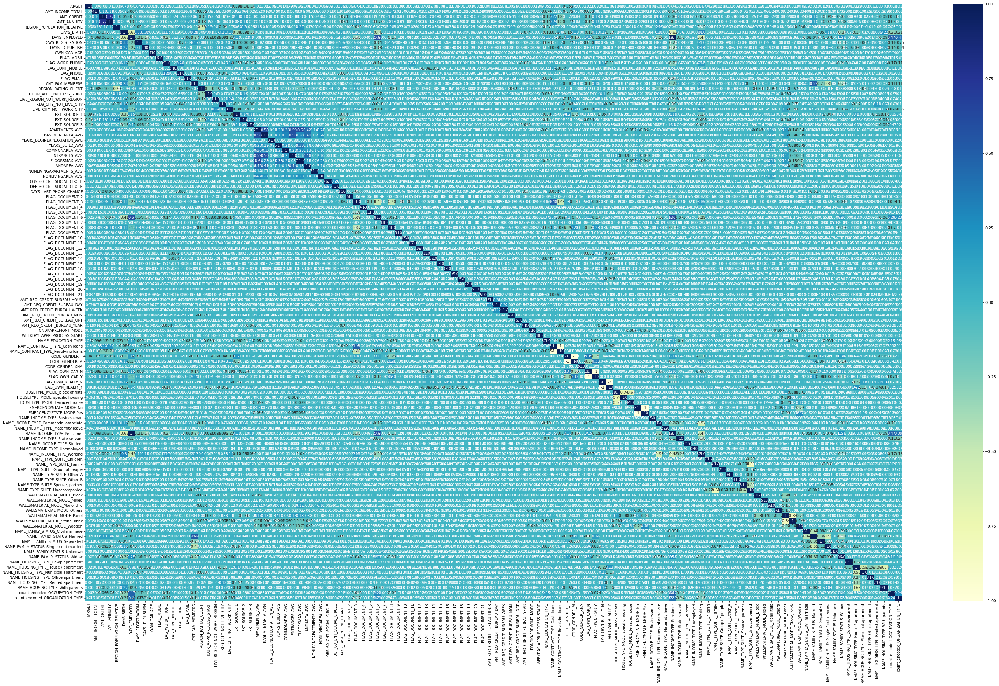

In [137]:
plt.figure(figsize=(50,30))
sns.heatmap(data.corr(), cmap="YlGnBu", annot=True)
plt.show()

**Correlation Conclusion:**<br>
After addressing missing values and converting data types in our dataset, we conducted a correlation analysis to identify any strong relationships between variables. However, our analysis did not reveal any significant correlations between the variables.

## Feature Distribution 
In this section, we are checking the feature distribution to determine which columns can be dropped in order to reduce the number of features. If a column has the same density distribution for both TARGET=0 and TARGET=1, we will drop it.<br>
When analyzing our data, we noticed that there were **many more instances of TARGET=0 compared to TARGET=1**. This is called **class imbalance** and can affect our analysis. To address this issue, we randomly selected the same number of instances with TARGET=0 and TARGET=1 using a technique called **under-sampling.** This helped us create a balanced dataset and conduct our analysis on a representative sample of the data.

In [138]:
# Number of each modality of the TARGET column: Class Imbalance Checking
data['TARGET'].value_counts()

0    282686
1     24825
Name: TARGET, dtype: int64

Text(0.5, 1.0, 'Checking Class Imbalance')

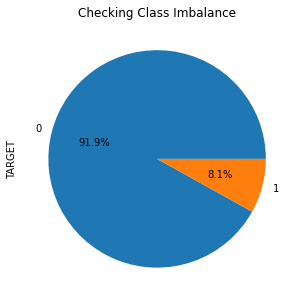

In [139]:
# Class Imbalance Checking
data['TARGET'].value_counts().plot(kind='pie',autopct='%1.1f%%', figsize=(10, 5))
plt.title('Checking Class Imbalance')

Our dataset is **unbalanced**, with only 8.1% of the transactions being fraudulent and the remaining 91.9% being genuine.

In [140]:
sampled_data.head()

,TARGET,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,OWN_CAR_AGE,FLAG_MOBIL,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,HOUR_APPR_PROCESS_START,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,LIVE_CITY_NOT_WORK_CITY,EXT_SOURCE_1,EXT_SOURCE_2,EXT_SOURCE_3,APARTMENTS_AVG,BASEMENTAREA_AVG,YEARS_BEGINEXPLUATATION_AVG,YEARS_BUILD_AVG,COMMONAREA_AVG,ENTRANCES_AVG,FLOORSMAX_AVG,LANDAREA_AVG,NONLIVINGAPARTMENTS_AVG,NONLIVINGAREA_AVG,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR,FONDKAPREMONT_MODE,WEEKDAY_APPR_PROCESS_START,NAME_EDUCATION_TYPE,NAME_CONTRACT_TYPE_Cash loans,NAME_CONTRACT_TYPE_Revolving loans,CODE_GENDER_F,CODE_GENDER_M,CODE_GENDER_XNA,FLAG_OWN_CAR_N,FLAG_OWN_CAR_Y,FLAG_OWN_REALTY_N,FLAG_OWN_REALTY_Y,HOUSETYPE_MODE_block of flats,HOUSETYPE_MODE_specific housing,HOUSETYPE_MODE_terraced house,EMERGENCYSTATE_MODE_No,EMERGENCYSTATE_MODE_Yes,NAME_INCOME_TYPE_Businessman,NAME_INCOME_TYPE_Commercial associate,NAME_INCOME_TYPE_Maternity leave,NAME_INCOME_TYPE_Pensioner,NAME_INCOME_TYPE_State servant,NAME_INCOME_TYPE_Student,NAME_INCOME_TYPE_Unemployed,NAME_INCOME_TYPE_Working,NAME_TYPE_SUITE_Children,NAME_TYPE_SUITE_Family,NAME_TYPE_SUITE_Group of people,NAME_TYPE_SUITE_Other_A,NAME_TYPE_SUITE_Other_B,"NAME_TYPE_SUITE_Spouse, partner",NAME_TYPE_SUITE_Unaccompanied,WALLSMATERIAL_MODE_Block,WALLSMATERIAL_MODE_Mixed,WALLSMATERIAL_MODE_Monolithic,WALLSMATERIAL_MODE_Others,WALLSMATERIAL_MODE_Panel,"WALLSMATERIAL_MODE_Stone, brick",WALLSMATERIAL_MODE_Wooden,NAME_FAMILY_STATUS_Civil marriage,NAME_FAMILY_STATUS_Married,NAME_FAMILY_STATUS_Separated,NAME_FAMILY_STATUS_Single / not married,NAME_FAMILY_STATUS_Unknown,NAME_FAMILY_STATUS_Widow,NAME_HOUSING_TYPE_Co-op apartment,NAME_HOUSING_TYPE_House / apartment,NAME_HOUSING_TYPE_Municipal apartment,NAME_HOUSING_TYPE_Office apartment,NAME_HOUSING_TYPE_Rented apartment,NAME_HOUSING_TYPE_With parents,count_encoded_OCCUPATION_TYPE,count_encoded_ORGANIZATION_TYPE
0,1,202500.0,406597.5,24700.5,0.018801,-9461,-637,-3648.0,-2120,NaN,1,0,1,1,0,1.0,2,10,0,0,0,0.083037,0.262949,0.139376,0.024700,0.03690,0.972200,0.619200,0.014300,0.06900,0.083300,0.036900,0.000000,0.00000,2.0,2.0,-1134.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,1.0,2,6,4,1.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,151577,67992
26,1,112500.0,979992.0,27076.5,0.018029,-18724,-2628,-6573.0,-1827,4.000000,1,0,1,0,0,1.0,3,9,0,0,0,0.502130,0.548477,0.190706,0.016500,0.00890,0.973200,0.717800,0.005450,0.06900,0.041700,0.026500,0.001925,0.00000,10.0,0.0,-161.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0.0,0.0,0.0,0.0,2.0,2.0,2,1,4,1.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,5946,67992
40,1,202500.0,1193580.0,35028.0,0.025164,-17482,-1262,-1182.0,-1029,3.000000,1,0,1,0,0,2.0,2,9,0,0,0,0.502130,0.306841,0.320163,0.130900,0.12500,0.996000,0.945600,0.082200,0.13790,0.250000,0.014200,0.003900,0.00780,0.0,0.0,-1075.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,2.0,0.0,4.0,1,5,4,1.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0

In [18]:
# Under Sampling
majority_class = data['TARGET'].value_counts().idxmax()
majority_class_data = data[data['TARGET'] == majority_class]
minority_class_data = data[data['TARGET'] != majority_class]
sample_size = len(minority_class_data)
sampled_majority_class_data = majority_class_data.sample(sample_size, random_state=42)
sampled_data = pd.concat([minority_class_data, sampled_majority_class_data], axis=0)

In [19]:
sampled_data['TARGET'].value_counts()

1    24825
0    24825
Name: TARGET, dtype: int64

C:\Users\MSI\anaconda3\lib\site-packages\seaborn\distributions.py:316: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  warnings.warn(msg, UserWarning)
C:\Users\MSI\anaconda3\lib\site-packages\seaborn\distributions.py:316: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  warnings.warn(msg, UserWarning)
C:\Users\MSI\anaconda3\lib\site-packages\seaborn\axisgrid.py:409: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(figsize=figsize)
C:\Users\MSI\anaconda3\lib\site-packages\seaborn\distributions.py:316: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.


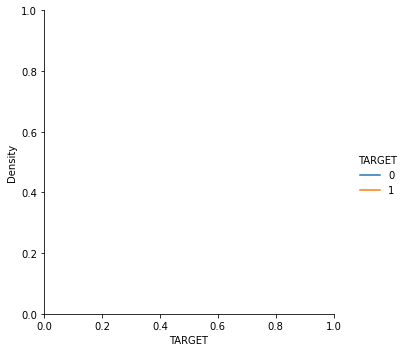

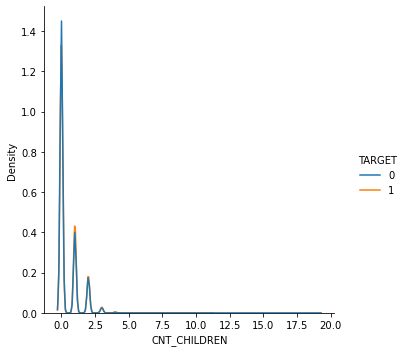

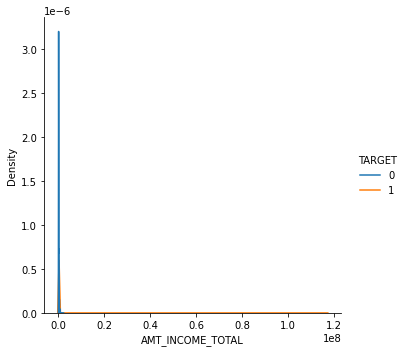

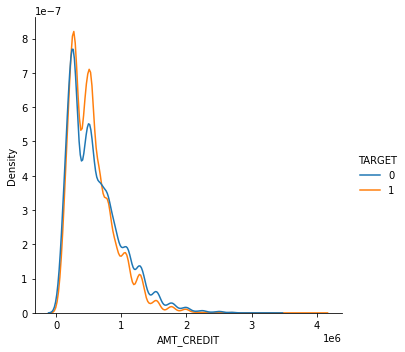

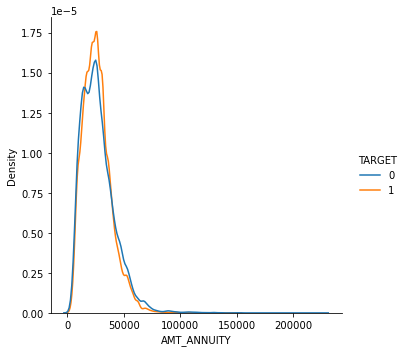

...

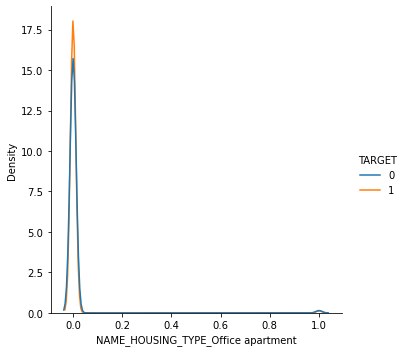

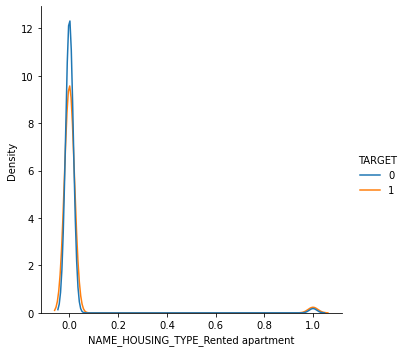

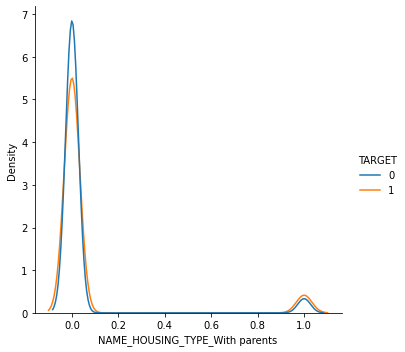

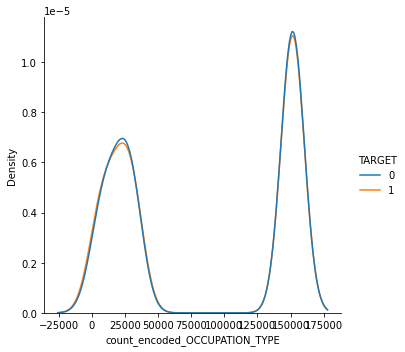

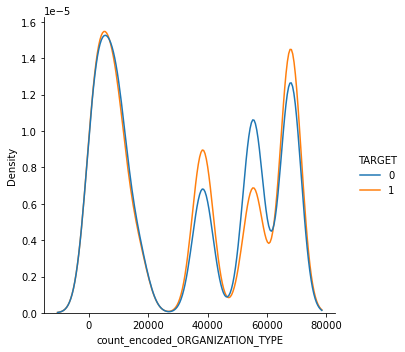

In [18]:
# Feature distribution of the sampled data
num_data = sampled_data.select_dtypes(include='number')

for feature in num_data.columns:
    # Plot the distribution of the feature
    sns.displot(data=sampled_data, x=feature, hue="TARGET", kind="kde")


In [17]:
data.drop(['FLAG_MOBIL','FLAG_CONT_MOBILE','FLAG_EMAIL','CNT_FAM_MEMBERS','LIVE_REGION_NOT_WORK_REGION','EXT_SOURCE_1'
          ,'APARTMENTS_AVG','BASEMENTAREA_AVG','YEARS_BEGINEXPLUATATION_AVG','YEARS_BUILD_AVG','COMMONAREA_AVG','ENTRANCES_AVG'
          ,'FLOORSMAX_AVG','LANDAREA_AVG','NONLIVINGAPARTMENTS_AVG','NONLIVINGAREA_AVG','OBS_60_CNT_SOCIAL_CIRCLE','DEF_60_CNT_SOCIAL_CIRCLE'
          ,'FLAG_DOCUMENT_2','FLAG_DOCUMENT_4','FLAG_DOCUMENT_5','FLAG_DOCUMENT_7','FLAG_DOCUMENT_8','FLAG_DOCUMENT_9','FLAG_DOCUMENT_10'
          ,'FLAG_DOCUMENT_11','FLAG_DOCUMENT_12','FLAG_DOCUMENT_13','FLAG_DOCUMENT_14','FLAG_DOCUMENT_15','FLAG_DOCUMENT_16'
          ,'FLAG_DOCUMENT_17','FLAG_DOCUMENT_18','FLAG_DOCUMENT_19','FLAG_DOCUMENT_20','FLAG_DOCUMENT_21','AMT_REQ_CREDIT_BUREAU_HOUR'
          ,'AMT_REQ_CREDIT_BUREAU_DAY','AMT_REQ_CREDIT_BUREAU_WEEK','AMT_REQ_CREDIT_BUREAU_MON','AMT_REQ_CREDIT_BUREAU_QRT'
          ,'AMT_REQ_CREDIT_BUREAU_YEAR','FONDKAPREMONT_MODE','WEEKDAY_APPR_PROCESS_START','CODE_GENDER_XNA','FLAG_OWN_REALTY_N'
          ,'FLAG_OWN_REALTY_Y','WALLSMATERIAL_MODE_Block','WALLSMATERIAL_MODE_Mixed','WALLSMATERIAL_MODE_Monolithic','WALLSMATERIAL_MODE_Others'
          ,'WALLSMATERIAL_MODE_Panel','WALLSMATERIAL_MODE_Stone, brick','WALLSMATERIAL_MODE_Wooden','NAME_FAMILY_STATUS_Unknown'
          ,'NAME_FAMILY_STATUS_Separated','count_encoded_OCCUPATION_TYPE','NAME_HOUSING_TYPE_Co-op apartment','NAME_HOUSING_TYPE_Municipal apartment'
          ,'HOUSETYPE_MODE_block of flats','HOUSETYPE_MODE_specific housing','HOUSETYPE_MODE_terraced house','EMERGENCYSTATE_MODE_No'
          ,'EMERGENCYSTATE_MODE_Yes','NAME_INCOME_TYPE_Businessman','NAME_INCOME_TYPE_Maternity leave','NAME_INCOME_TYPE_Student','NAME_INCOME_TYPE_Unemployed'
          ,'NAME_TYPE_SUITE_Children','NAME_TYPE_SUITE_Group of people','NAME_TYPE_SUITE_Other_A','NAME_TYPE_SUITE_Other_B','NAME_TYPE_SUITE_Spouse, partner'
          ,'NAME_TYPE_SUITE_Unaccompanied','NAME_TYPE_SUITE_Family'], axis=1, inplace=True)

In [18]:
data.shape

(307511, 41)

In [19]:
Final_data = data.copy()

In [20]:
Final_data.shape

(307511, 41)

## Data Imbalance
We have identified a class imbalance issue in our dataframe. To address this, we will use the SMOTE method for oversampling in this section. This technique involves creating synthetic samples of the minority class to balance the dataset

Text(0.5, 1.0, 'Checking Class Imbalance')

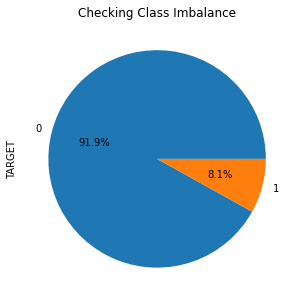

In [25]:
# Class Imbalance Checking
Final_data['TARGET'].value_counts().plot(kind='pie',autopct='%1.1f%%', figsize=(10, 5))
plt.title('Checking Class Imbalance')

In [21]:
# Over Sampling: SMOTE
X = Final_data.drop('TARGET', axis=1)
y = Final_data['TARGET']
# Initialize the SMOTE algorithm with the sampling_strategy parameter set to 'minority' to oversample the minority class and random_state parameter for reproducibility.
smote = SMOTE(sampling_strategy='minority', random_state=42)

# Applyin SMOTE the the dataframe
X_resampled, y_resampled = smote.fit_resample(X, y)

In [64]:
# Verifcation
print('Before SMOTE:\n', y.value_counts())
print('After SMOTE:\n', y_resampled.value_counts())

Before SMOTE:
 0    282686
1     24825
Name: TARGET, dtype: int64
After SMOTE:
 1    282686
0    282686
Name: TARGET, dtype: int64


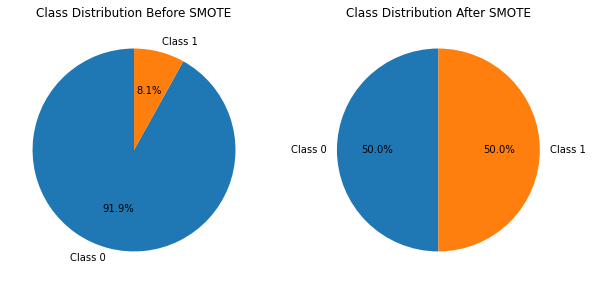

In [27]:
# Class Imbalance Checking
labels = ['Class 0', 'Class 1']
fig, ax = plt.subplots(1, 2, figsize=(10, 5))
ax[0].pie(y.value_counts(), labels=labels, autopct='%1.1f%%', startangle=90)
ax[0].set_title('Class Distribution Before SMOTE')
ax[1].pie(y_resampled.value_counts(), labels=labels, autopct='%1.1f%%', startangle=90)
ax[1].set_title('Class Distribution After SMOTE')
plt.show()

# Classification Models

In [22]:
# Importing Librairies

from sklearn.model_selection import train_test_split

# Random Forest Libraireis
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report

#SVM Librairies
from sklearn.svm import SVC

# Scaler Librairies
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import StandardScaler

# Cross Validation
from sklearn.model_selection import cross_val_score

### Splitting Data into Training set and Test set 

In [23]:
X_train, X_test, y_train, y_test = train_test_split(X_resampled, y_resampled, test_size=0.3, random_state=42)

## Random Forest Model

In [24]:
# Random Forest
classifier_rf = RandomForestClassifier(random_state=42, n_estimators=100, oob_score=True, max_depth=10, min_samples_split=5,
                                      min_samples_leaf=2)

# Fitting Train Data
classifier_rf.fit(X_train, y_train)

RandomForestClassifier(max_depth=10, min_samples_leaf=2, min_samples_split=5,
                       oob_score=True, random_state=42)

In [25]:
# Predict on Training Data
y_pred_Train = classifier_rf.predict(X_train)
# Afficher le rapport de classification
print(classification_report(y_train, y_pred_Train))

              precision    recall  f1-score   support

           0       0.87      0.98      0.92    197841
           1       0.98      0.85      0.91    197919

    accuracy                           0.92    395760
   macro avg       0.92      0.92      0.92    395760
weighted avg       0.92      0.92      0.92    395760



In [25]:
# Predict on the Test Data
y_pred_rf = classifier_rf.predict(X_test)

# Afficher le rapport de classification
print(classification_report(y_test, y_pred_rf))

              precision    recall  f1-score   support

           0       0.87      0.98      0.92     84845
           1       0.98      0.85      0.91     84767

    accuracy                           0.92    169612
   macro avg       0.92      0.92      0.92    169612
weighted avg       0.92      0.92      0.92    169612



In [26]:
# checking the oob score
classifier_rf.oob_score_

0.9146881948655751

## NOTES :
I've added three hyperparameters (max_depth, min_samples_split, min_samples_leaf) to control the complexity of each individual tree in the random forest:

max_depth: This limits the maximum depth of each tree. A smaller value such as 10 helps prevent overfitting by restricting the depth and preventing the trees from becoming overly complex.

min_samples_split: This sets the minimum number of samples required to split an internal node. By increasing this value, you encourage the tree to find splits that are more meaningful, reducing overfitting.

min_samples_leaf: This specifies the minimum number of samples required to be at a leaf node. Similar to min_samples_split, increasing this value promotes more generalized splits.

## Conclusion:
**For the training data:**

- Precision for class 0 (non-occurrence) is 0.87, which means that 87% of the predicted non-occurrence cases are actually non-occurrences.
- Recall for class 0 is 0.98, indicating that the model correctly identifies 98% of the actual non-occurrence cases.
- F1-score for class 0 is 0.92, which is the harmonic mean of precision and recall. It provides a balanced measure of the model's performance.
- Support for class 0 is 84,845, indicating the number of samples in the training data that belong to class 0.
For the testing data:

The precision, recall, and F1-score for class 0 are the same as the training data since they represent the performance on class 0 (non-occurrence).

Support for class 0 is 197,841, indicating the number of samples in the testing data that belong to class 0.

**For the testing data:**

- The precision, recall, and F1-score for class 0 are the same as the training data since they represent the performance on class 0 (non-occurrence).
- Support for class 0 is 197,841, indicating the number of samples in the testing data that belong to class 0.

Based on the evaluation metrics you provided, the model seems to perform well, with high precision, recall, and F1-score for class 0 (non-occurrence) on both the training and testing data. This indicates that the model can accurately predict non-occurrence cases and has a good balance between precision and recall.

However, it's important to consider the **possibility of overfitting** since the performance on the training and testing data is **similar**. Overfitting occurs when a model learns the training data too well and struggles to generalize to unseen data. To assess the model's generalization performance and mitigate overfitting concerns, we'll applying **Cross-Validation**.

By applying cross-validation, we can evaluate the model's performance on multiple folds of the data and obtain more robust estimates of its performance. This approach helps validate whether the model's performance is consistent across different subsets of the data and can provide insights into potential overfitting issues.

#### We are assessing the model's performance to determine its effectiveness in predicting accurately or not via Cross Validation

In [37]:
scores = cross_val_score(classifier_rf, X_resampled, y_resampled, cv=8)  # cv=5 indicates 5-fold cross-validation

# Print the accuracy scores for each fold
print("Accuracy scores:", scores)

# Calculate and print the mean accuracy
mean_accuracy = scores.mean()
print("Mean accuracy:", mean_accuracy)

Accuracy scores: [0.64332409 0.95408365 0.95213097 0.95285261 0.95520086 0.95412545
 0.95228594 0.95200294]
Mean accuracy: 0.914500816474705


## Conclusion:
These results suggest that the model performs consistently well across different folds of the cross-validation process. The average accuracy of 0.914 indicates that, on average, the model correctly predicts the target variable in 91.45% of the cases.

### Data Normalization

In [27]:
# Scale the input features using StandardScaler
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

## Logistic Regression

In [28]:
from sklearn.linear_model import LogisticRegression

In [29]:
model_LG = LogisticRegression(C=0.1,penalty='l2', max_iter=1000)
model_LG.fit(X_train_scaled, y_train)

LogisticRegression(C=0.1, max_iter=1000)

In [30]:
# Predict on Training Data
y_pred_Train = model_LG.predict(X_train_scaled)
# Afficher le rapport de classification
print(classification_report(y_train, y_pred_Train))

              precision    recall  f1-score   support

           0       0.77      0.75      0.76    197841
           1       0.76      0.77      0.76    197919

    accuracy                           0.76    395760
   macro avg       0.76      0.76      0.76    395760
weighted avg       0.76      0.76      0.76    395760



In [31]:
# Predict on the Test Data
y_pred = model_LG.predict(X_test_scaled)

# Afficher le rapport de classification
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.77      0.75      0.76     84845
           1       0.75      0.77      0.76     84767

    accuracy                           0.76    169612
   macro avg       0.76      0.76      0.76    169612
weighted avg       0.76      0.76      0.76    169612



In [28]:
scores = cross_val_score(model_LG, X_resampled, y_resampled, cv=5)  # cv=5 indicates 5-fold cross-validation

# Print the accuracy scores for each fold
print("Accuracy scores:", scores)

# Calculate and print the mean accuracy
mean_accuracy = scores.mean()
print("Mean accuracy:", mean_accuracy)

Accuracy scores: [0.56003537 0.56084015 0.55788245 0.56141996 0.55723685]
Mean accuracy: 0.5594829565142736


## Naive Bayes Model

In [32]:
from sklearn.naive_bayes import GaussianNB 

In [39]:
classifier_NB = GaussianNB()  
classifier_NB.fit(X_train, y_train)

GaussianNB(var_smoothing=0.0001)

In [58]:
# Predict on the Train Data
y_pred_Train = classifier_NB.predict(X_train)
# Afficher le rapport de classification
print(classification_report(y_train, y_pred_Train))

              precision    recall  f1-score   support

           0       0.51      0.95      0.66    197841
           1       0.63      0.09      0.16    197919

    accuracy                           0.52    395760
   macro avg       0.57      0.52      0.41    395760
weighted avg       0.57      0.52      0.41    395760



In [40]:
# Predict on the Test Data
y_pred_Test = classifier_NB.predict(X_test)
# Afficher le rapport de classification
print(classification_report(y_test, y_pred_Test))

              precision    recall  f1-score   support

           0       0.50      0.97      0.66     84845
           1       0.44      0.03      0.05     84767

    accuracy                           0.50    169612
   macro avg       0.47      0.50      0.35    169612
weighted avg       0.47      0.50      0.35    169612



## Conclusion:
Based on the results you provided, the GaussianNB model achieved an accuracy of 0.52 on the training set and an accuracy of 0.50 on the test set.

**Accuracy:** The model's accuracy is slightly above 0.5, which means it performs slightly better than random guessing. However, it is still relatively low and suggests that the model is not effectively capturing the underlying patterns in the data.

**Precision-Recall Trade-off:** The model achieves higher precision for class 1 but at the cost of very low recall. This indicates that when the model predicts a sample as class 1, it is often correct, but it misses a large portion of actual class 1 samples.

**Generalization:** The model's performance on the test set is similar to the training set, suggesting that it is not overfitting or underfitting the data. However, the low accuracy, recall, and F1-score for class 1 indicate that the model is not able to effectively generalize to unseen data, especially for the minority class.

Based on these observations, it is clear that the GaussianNB model **struggles to accurately predict class 1**.

### Data Normalization

In [41]:
# Normalisation des données

# Initialize the MinMaxScaler
scaler = MinMaxScaler()

# Normalize the features in X_resampled
X_resampled_normalized = scaler.fit_transform(X_resampled)

# Convert the normalized numpy array to a DataFrame
X_resampled_normalized_df = pd.DataFrame(X_resampled_normalized, columns=X.columns)

In [42]:
X_resampled_normalized_df.head()

,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,OWN_CAR_AGE,FLAG_WORK_PHONE,...,NAME_INCOME_TYPE_Working,NAME_FAMILY_STATUS_Civil marriage,NAME_FAMILY_STATUS_Married,NAME_FAMILY_STATUS_Single / not married,NAME_FAMILY_STATUS_Widow,NAME_HOUSING_TYPE_House / apartment,NAME_HOUSING_TYPE_Office apartment,NAME_HOUSING_TYPE_Rented apartment,NAME_HOUSING_TYPE_With parents,count_encoded_ORGANIZATION_TYPE
0,0.001512,0.090287,0.090032,0.256321,0.888839,0.045086,0.852140,0.705433,0.132337,0.0,...,1.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,1.000000
1,0.002089,0.311736,0.132924,0.045016,0.477114,0.043648,0.951929,0.959566,0.132337,0.0,...,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.130488
2,0.000358,0.022472,0.020025,0.134897,0.348534,0.046161,0.827335,0.648326,0.285714,1.0,...,1.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.152719
3,0.000935,0.066837,0.109477,0.107023,0.350846,0.038817,0.601451,0.661387,0.260989,0.0,...,1.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.000000
4,0.000819,0.116854,0.078975,0.392880,0.298591,0.038820,0.825268,0.519522,0.236264,0.0,...,1.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.000897


### Splitting Data into Training set and Test set after normalization

In [43]:
X_train, X_test, y_train, y_test = train_test_split(X_resampled_normalized, y_resampled, test_size=0.3, random_state=42)

## Neural Network Model

In [44]:
from tensorflow import keras
from tensorflow.keras import layers

# Define the model architecture
model = keras.Sequential([
    layers.Dense(64, activation='relu', input_shape=(X_resampled_normalized.shape[1],)),
    layers.Dense(64, activation='relu'),
    layers.Dense(1, activation='sigmoid')
])

# Compile the model
model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

# Train the model
model.fit(X_train, y_train, epochs=10, batch_size=32)

# Evaluate the model
loss, accuracy = model.evaluate(X_test, y_test)
print("Test Loss:", loss)
print("Test Accuracy:", accuracy)

Epoch 1/10
12368/12368 [==============================] - 15s 1ms/step - loss: 0.3095 - accuracy: 0.8676
Epoch 2/10
12368/12368 [==============================] - 15s 1ms/step - loss: 0.2416 - accuracy: 0.9026
Epoch 3/10
12368/12368 [==============================] - 16s 1ms/step - loss: 0.2264 - accuracy: 0.9096
Epoch 4/10
12368/12368 [==============================] - 13s 1ms/step - loss: 0.2159 - accuracy: 0.9143
Epoch 5/10
12368/12368 [==============================] - 13s 1ms/step - loss: 0.2100 - accuracy: 0.9174
Epoch 6/10
12368/12368 [==============================] - 13s 1ms/step - loss: 0.2067 - accuracy: 0.9186
Epoch 7/10
12368/12368 [==============================] - 13s 1ms/step - loss: 0.2036 - accuracy: 0.9205
Epoch 8/10
12368/12368 [==============================] - 13s 1ms/step - loss: 0.2020 - accuracy: 0.9209
Epoch 9/10
12368/12368 [==============================] - 13s 1ms/step - loss: 0.2004 - accuracy: 0.9219
Epoch 10/10
5301/5301 [==============================] 

### NOTES :
The neural network architecture consists of three layers: two hidden layers with 64 units each, using the ReLU activation function, and an output layer with a single unit using the sigmoid activation function for binary classification.

The model is compiled with the Adam optimizer, binary cross-entropy loss function, and accuracy metric. You can adjust the optimizer and loss function based on your specific requirements.

## Conclusion:
**Training Accuracy:** The model achieved an accuracy of approximately 92.20% on the training data. This indicates that the model is able to learn patterns and make accurate predictions on the data it was trained on.

**Testing Accuracy:** The model achieved an accuracy of approximately 92.38% on the test data. This suggests that the model generalizes well and is able to make accurate predictions on unseen data. It's important to note that the testing accuracy is similar to the training accuracy, which indicates that the model is not overfitting or underfitting the data.

**Loss:** The loss value measures how well the model is able to minimize the error during training. In this case, the loss decreases gradually over the epochs, indicating that the model is learning and adjusting its weights to minimize the error. The final loss value on the test data is 0.1988, which is relatively low.

**Training Time:** Each epoch took approximately 14-15 seconds to complete, which could be considered a reasonable training time depending on the size and complexity of the dataset.

Considering the high accuracy achieved on both the training and test data, as well as the decreasing loss values, it can be concluded that the model is performing well

## Accuracy Comparaison between Models ( Neural Network, Naive Bayes, Random Forest and Logistic Regression ) 

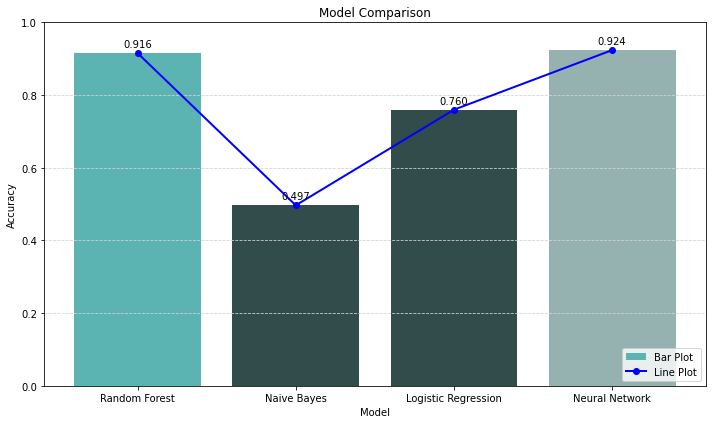

In [47]:
import matplotlib.pyplot as plt
from sklearn.metrics import accuracy_score

labels = ['Random Forest', 'Naive Bayes', 'Logistic Regression', 'Neural Network']
accuracy_scores_bar = [accuracy_score(y_test, y_pred_rf), accuracy_score(y_test, y_pred_Test),accuracy_score(y_test, y_pred), accuracy]
accuracy_scores_line = [accuracy_score(y_test, y_pred_rf), accuracy_score(y_test, y_pred_Test),accuracy_score(y_test, y_pred), accuracy]

plt.figure(figsize=(10, 6))  # Set the figure size

# Create a bar plot
bar_plot = plt.bar(labels, accuracy_scores_bar, color=['#5BB3B2', '#324B4B','#324B4B', '#95B1B0'])  # You can specify custom colors if desired

# Create a line plot with markers
line_plot = plt.plot(labels, accuracy_scores_line, marker='o', linestyle='-', color='blue', linewidth=2)

# Add data labels on top of each marker
for i, score in enumerate(accuracy_scores_line):
    plt.text(i, score + 0.01, f'{score:.3f}', ha='center', va='bottom')

plt.xlabel('Model')
plt.ylabel('Accuracy')
plt.title('Model comparison')

plt.ylim(0, 1)  # Set the y-axis limits

plt.grid(True, axis='y', linestyle='--', color='lightgray')  # Add horizontal grid lines

# Create a legend for the two plots
plt.legend([bar_plot[0], line_plot[0]], ['Bar Plot', 'Line Plot'], loc='lower right')

plt.tight_layout()  # Adjust the spacing

plt.show()


## Conclusion:
**The Random Forest model** achieved an **accuracy of 91.56%**. This model is an ensemble learning method that combines multiple decision trees to make predictions. It performs well in capturing complex relationships and interactions in the data, which can lead to accurate predictions. With its relatively high accuracy, the **Random Forest model could be a suitable choice**.

**The Naive Bayes model** achieved an **accuracy of 49.67%**. This model is based on the assumption of independence between features, which might not hold true in some cases. The lower accuracy suggests that the **Naive Bayes model may not be the most appropriate choice**, as it might struggle to capture the complex relationships present in the data.

**The Logistic Regression model** achieved an **accuracy of 75.98%**. Logistic Regression is a linear model that is commonly used for binary classification tasks. While it has a lower accuracy compared to the Random Forest and Neural Network models, it can still be a viable option depending on the specific requirements of the classification task and the interpretability of the model. Logistic Regression is known for its simplicity and ease of interpretation.

**The Neural Network model** achieved the **highest accuracy of 92.38%**. Neural networks are powerful models that can capture intricate patterns and relationships in the data. They are particularly effective in handling complex and high-dimensional data. The high accuracy of the Neural Network model indicates that it has learned the underlying patterns in the data and can make accurate predictions. However, it's important to note that neural networks can be computationally intensive and require substantial computational resources.

In conclusion, based on the accuracy results, the **Random Forest** and **Neural Network** models perform the best among the evaluated models. The Random Forest model offers a good balance between accuracy and interpretability, while the Neural Network model provides the highest accuracy at the cost of increased computational complexity.